In [1]:
# Import required libraries
import os
import re
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
 
"""
We've downloaded the "train" folder. The original train set images lie inside
the "original" folder.
"""
# Define paths for training dataset and image directory
DATA_DIR = 'E:/Chrome Download/uw-madison-gi-tract-image-segmentation'

# Open the training dataframe and display the initial dataframe
TRAIN_CSV = os.path.join(DATA_DIR, "train.csv")

ORIG_IMG_DIR = os.path.join(DATA_DIR, "train")
CASE_FOLDERS = os.listdir(ORIG_IMG_DIR)
 
# Define paths for training and validation image and mask directories
ROOT_DATASET_DIR = "dataset_UWM_GI_Tract_train_valid"
ROOT_TRAIN_IMG_DIR = os.path.join(ROOT_DATASET_DIR, "train", "images")
ROOT_TRAIN_MSK_DIR = os.path.join(ROOT_DATASET_DIR, "train", "masks")
ROOT_VALID_IMG_DIR = os.path.join(ROOT_DATASET_DIR, "valid", "images")
ROOT_VALID_MSK_DIR = os.path.join(ROOT_DATASET_DIR, "valid", "masks")
 
# Create directories if not already present
os.makedirs(ROOT_TRAIN_IMG_DIR, exist_ok=True)
os.makedirs(ROOT_TRAIN_MSK_DIR, exist_ok=True)
os.makedirs(ROOT_VALID_IMG_DIR, exist_ok=True)
os.makedirs(ROOT_VALID_MSK_DIR, exist_ok=True)
 
# Define regular expressions to extract case, date, slice number, and image shape from file paths
GET_CASE_AND_DATE = re.compile(r"case[0-9]{1,3}_day[0-9]{1,3}")
GET_SLICE_NUM = re.compile(r"slice_[0-9]{1,4}")
IMG_SHAPE = re.compile(r"_[0-9]{1,3}_[0-9]{1,3}_")
 
# Load the main dataframe from csv file and drop rows with null values
MAIN_DF = pd.read_csv(TRAIN_CSV).dropna(axis=0)
only_IDS = MAIN_DF["id"].to_numpy()
 
# Define classes for image segmentation
CLASSES = ["large_bowel", "small_bowel", "stomach"]
 
# Create a mapping of class ID to RGB value
color2id = {
    (0, 0, 0): 0,  # background pixel
    (0, 0, 255): 1,  # Blue - Stomach
    (0, 255, 0): 2,  # Green - Small bowel
    (255, 0, 0): 3,  # Red - Large bowel
}
 
# Reverse map from id to color
id2color = {v: k for k, v in color2id.items()}
 
 
# Function to get all relevant image files in a given directory
def get_folder_files(folder_path):
    all_relevant_imgs_in_case = []
    img_ids = []
 
    for dir, _, files in os.walk(folder_path):
        if not len(files):
            continue
 
        for file_name in files:
            src_file_path = os.path.join(dir, file_name)
 
            case_day = GET_CASE_AND_DATE.search(src_file_path).group()
            slice_id = GET_SLICE_NUM.search(src_file_path).group()
            image_id = case_day + "_" + slice_id
 
            if image_id in only_IDS:
                all_relevant_imgs_in_case.append(src_file_path)
                img_ids.append(image_id)
 
    return all_relevant_imgs_in_case, img_ids
 
 
# Function to decode Run-Length Encoding (RLE) into an image mask
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_decode(mask_rle, shape):
    """
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return
    Returns numpy array, 1 - mask, 0 - background
 
    """
    s = np.asarray(mask_rle.split(), dtype=int)
    starts = s[0::2] - 1
    lengths = s[1::2]
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)  # Needed to align to RLE direction
 
 
# Function to load and convert image from a uint16 to uint8 datatype.
def load_img(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
    img = (img - img.min()) / (img.max() - img.min()) * 255.0
    img = img.astype(np.uint8)
    img = np.tile(img[..., None], [1, 1, 3])  # gray to rgb
    return img
 
 
# Function to convert RGB image to one-hot encoded grayscale image based on color map.
def rgb_to_onehot_to_gray(rgb_arr, color_map=id2color):
    num_classes = len(color_map)
    shape = rgb_arr.shape[:2] + (num_classes,)
    arr = np.zeros(shape, dtype=np.float32)
 
    for i, cls in enumerate(color_map):
        arr[:, :, i] = np.all(rgb_arr.reshape((-1, 3)) == color_map[i], axis=1).reshape(shape[:2])
 
    return arr.argmax(-1)
 
 
# Function to create and write image-mask pair for each file path in given directories.
def create_and_write_img_msk(file_paths, file_ids, save_img_dir, save_msk_dir, desc=None):
    for file_path, file_id in tqdm(zip(file_paths, file_ids), ascii=True, total=len(file_ids), desc=desc, leave=True):
        image = load_img(file_path)
 
        IMG_DF = MAIN_DF[MAIN_DF["id"] == file_id]
 
        img_shape_H_W = list(map(int, IMG_SHAPE.search(file_path).group()[1:-1].split("_")))[::-1]
        mask_image = np.zeros(img_shape_H_W + [len(CLASSES)], dtype=np.uint8)
 
        for i, class_label in enumerate(CLASSES):
            class_row = IMG_DF[IMG_DF["class"] == class_label]
 
            if len(class_row):
                rle = class_row.segmentation.squeeze()
                mask_image[..., i] = rle_decode(rle, img_shape_H_W) * 255
 
        mask_image = rgb_to_onehot_to_gray(mask_image, color_map=id2color)
 
        FILE_CASE_AND_DATE = GET_CASE_AND_DATE.search(file_path).group()
        FILE_NAME = os.path.split(file_path)[-1]
 
        new_name = FILE_CASE_AND_DATE + "_" + FILE_NAME
 
        dst_img_path = os.path.join(save_img_dir, new_name)
        dst_msk_path = os.path.join(save_msk_dir, new_name)
 
        cv2.imwrite(dst_img_path, image)
        cv2.imwrite(dst_msk_path, mask_image)
 
    return

In [2]:
import os
import zipfile
import platform
import warnings
from glob import glob
from dataclasses import dataclass
 
# To filter UserWarning.
warnings.filterwarnings("ignore", category=UserWarning)
 
import cv2
import requests
import numpy as np
# from tqdm import tqdm
import matplotlib.pyplot as plt
 
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
 
 
# For data augmentation and preprocessing.
import albumentations as A
from albumentations.pytorch import ToTensorV2
 
# Imports required SegFormer classes
from transformers import SegformerForSemanticSegmentation
 
# Importing lighting along with a built-in callback it provides.
import lightning.pytorch as pl
from lightning.pytorch.loggers import WandbLogger
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint
 
# Importing torchmetrics modular and functional implementations.
from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassF1Score
 
# To print model summary.
from torchinfo import summary
 
# Sets the internal precision of float32 matrix multiplications.
torch.set_float32_matmul_precision('high')
 
# To enable determinism.
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"
 
# To render the matplotlib figure in the notebook.
%matplotlib inline

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.14 (you have 1.4.11). Upgrade using: pip install --upgrade albumentations


In [3]:
import wandb
 
wandb.login()

wandb: Currently logged in as: wilsonyjk. Use `wandb login --relogin` to force relogin


True

In [4]:
@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES:   int = 4 # including background.
    IMAGE_SIZE: tuple[int,int] = (288, 288) # W, H
    MEAN: tuple = (0.485, 0.456, 0.406)
    STD:  tuple = (0.229, 0.224, 0.225)
    BACKGROUND_CLS_ID: int = 0
    URL: str = r"https://www.dropbox.com/scl/fi/r0685arupp33sy31qhros/dataset_UWM_GI_Tract_train_valid.zip?rlkey=w4ga9ysfiuz8vqbbywk0rdnjw&dl=1"
    DATASET_PATH: str = os.path.join(os.getcwd(), "dataset_UWM_GI_Tract_train_valid")
    CHANNELS: int = 3
 
@dataclass(frozen=True)
class Paths:
    DATA_TRAIN_IMAGES: str = os.path.join(DatasetConfig.DATASET_PATH, "train", "images", r"*.png")
    DATA_TRAIN_LABELS: str = os.path.join(DatasetConfig.DATASET_PATH, "train", "masks",  r"*.png")
    DATA_VALID_IMAGES: str = os.path.join(DatasetConfig.DATASET_PATH, "valid", "images", r"*.png")
    DATA_VALID_LABELS: str = os.path.join(DatasetConfig.DATASET_PATH, "valid", "masks",  r"*.png")
         
@dataclass
class TrainingConfig:
    BATCH_SIZE:      int = 48 # 32. On colab you should be able to use batch size of 32 with T4 GPU.
    NUM_EPOCHS:      int = 100
    INIT_LR:       float = 3e-4
    NUM_WORKERS:     int = 0 if platform.system() == "Windows" else 12 # os.cpu_count()
 
    OPTIMIZER_NAME:  str = "AdamW"
    WEIGHT_DECAY:  float = 1e-4
    USE_SCHEDULER:  bool = True # Use learning rate scheduler?
    SCHEDULER:       str = "MultiStepLR" # Name of the scheduler to use.
    MODEL_NAME:      str = "nvidia/segformer-b4-finetuned-ade-512-512"
     
 
@dataclass
class InferenceConfig:
    BATCH_SIZE:  int = 1
    NUM_BATCHES: int = 1

In [5]:
# Create a mapping from class ID to RGB color value. Required for visualization.
id2color = {
    0: (0, 0, 0),    # background pixel
    1: (0, 0, 255),  # Stomach
    2: (0, 255, 0),  # Small Bowel
    3: (255, 0, 0),  # large Bowel
}
 
print("Number of classes", DatasetConfig.NUM_CLASSES)
 
# Reverse id2color mapping.
# Used for converting RGB mask to a single channel (grayscale) representation.
rev_id2color = {value: key for key, value in id2color.items()}

Number of classes 4


In [6]:
class MedicalDataset(Dataset):
    def __init__(self, *, image_paths, mask_paths, img_size, ds_mean, ds_std, is_train=False):
        self.image_paths = image_paths
        self.mask_paths  = mask_paths  
        self.is_train    = is_train
        self.img_size    = img_size
        self.ds_mean = ds_mean
        self.ds_std = ds_std
        self.transforms  = self.setup_transforms(mean=self.ds_mean, std=self.ds_std)
 
    def __len__(self):
        return len(self.image_paths)
 
    def setup_transforms(self, *, mean, std):
        transforms = []
 
        # Augmentation to be applied to the training set.
        if self.is_train:
            transforms.extend([
                A.HorizontalFlip(p=0.5), A.VerticalFlip(p=0.5),
                A.ShiftScaleRotate(scale_limit=0.12, rotate_limit=0.15, shift_limit=0.12, p=0.5),
                A.RandomBrightnessContrast(p=0.5),
                A.CoarseDropout(max_holes=8, max_height=self.img_size[1]//20, max_width=self.img_size[0]//20, min_holes=5, fill_value=0, mask_fill_value=0, p=0.5)
            ])
 
        # Preprocess transforms - Normalization and converting to PyTorch tensor format (HWC --> CHW).
        transforms.extend([
                A.Normalize(mean=mean, std=std, always_apply=True),
                ToTensorV2(always_apply=True),  # (H, W, C) --> (C, H, W)
        ])
        return A.Compose(transforms)
 
    def load_file(self, file_path, depth=0):
        file = cv2.imread(file_path, depth)
        if depth == cv2.IMREAD_COLOR:
            file = file[:, :, ::-1]
        return cv2.resize(file, (self.img_size), interpolation=cv2.INTER_NEAREST)
 
    def __getitem__(self, index):
        # Load image and mask file.
        image = self.load_file(self.image_paths[index], depth=cv2.IMREAD_COLOR)
        mask  = self.load_file(self.mask_paths[index],  depth=cv2.IMREAD_GRAYSCALE)
         
        # Apply Preprocessing (+ Augmentations) transformations to image-mask pair
        transformed = self.transforms(image=image, mask=mask)
        image, mask = transformed["image"], transformed["mask"].to(torch.long)
        return image, mask

In [7]:
class MedicalSegmentationDataModule(pl.LightningDataModule):
    def __init__(
        self,
        num_classes=10,
        img_size=(384, 384),
        ds_mean=(0.485, 0.456, 0.406),
        ds_std=(0.229, 0.224, 0.225),
        batch_size=32,
        num_workers=0,
        pin_memory=False,
        shuffle_validation=False,
    ):
        super().__init__()
 
        self.num_classes = num_classes
        self.img_size    = img_size
        self.ds_mean     = ds_mean
        self.ds_std      = ds_std
        self.batch_size  = batch_size
        self.num_workers = num_workers
        self.pin_memory  = pin_memory
         
        self.shuffle_validation = shuffle_validation
 
    def prepare_data(self):
        # Download dataset.
        dataset_zip_path = f"{DatasetConfig.DATASET_PATH}.zip"
 
        # Download if dataset does not exists.
        if not os.path.exists(DatasetConfig.DATASET_PATH):
 
            print("Downloading and extracting assets...", end="")
            file = requests.get(DatasetConfig.URL)
            open(dataset_zip_path, "wb").write(file.content)
 
            try:
                with zipfile.ZipFile(dataset_zip_path) as z:
                    z.extractall(os.path.split(dataset_zip_path)[0]) # Unzip where downloaded.
                    print("Done")
            except:
                print("Invalid file")
 
            os.remove(dataset_zip_path) # Remove the ZIP file to free storage space.
 
    def setup(self, *args, **kwargs):
        # Create training dataset and dataloader.
        train_imgs = sorted(glob(f"{Paths.DATA_TRAIN_IMAGES}"))
        train_msks  = sorted(glob(f"{Paths.DATA_TRAIN_LABELS}"))
 
        # Create validation dataset and dataloader.
        valid_imgs = sorted(glob(f"{Paths.DATA_VALID_IMAGES}"))
        valid_msks = sorted(glob(f"{Paths.DATA_VALID_LABELS}"))
 
        self.train_ds = MedicalDataset(image_paths=train_imgs, mask_paths=train_msks, img_size=self.img_size,  
                                       is_train=True, ds_mean=self.ds_mean, ds_std=self.ds_std)
 
        self.valid_ds = MedicalDataset(image_paths=valid_imgs, mask_paths=valid_msks, img_size=self.img_size, 
                                       is_train=False, ds_mean=self.ds_mean, ds_std=self.ds_std)
 
    def train_dataloader(self):
        # Create train dataloader object with drop_last flag set to True.
        return DataLoader(
            self.train_ds, batch_size=self.batch_size,  pin_memory=self.pin_memory, 
            num_workers=self.num_workers, drop_last=True, shuffle=True
        )    
 
    def val_dataloader(self):
        # Create validation dataloader object.
        return DataLoader(
            self.valid_ds, batch_size=self.batch_size,  pin_memory=self.pin_memory, 
            num_workers=self.num_workers, shuffle=self.shuffle_validation
        )

In [8]:
%%time
 
dm = MedicalSegmentationDataModule(
    num_classes=DatasetConfig.NUM_CLASSES,
    img_size=DatasetConfig.IMAGE_SIZE,
    ds_mean=DatasetConfig.MEAN,
    ds_std=DatasetConfig.STD,
    batch_size=InferenceConfig.BATCH_SIZE,
    num_workers=0,
    shuffle_validation=True,
)
 
# Donwload dataset.
dm.prepare_data()
 
# Create training & validation dataset.
dm.setup()
 
train_loader, valid_loader = dm.train_dataloader(), dm.val_dataloader()

CPU times: total: 172 ms
Wall time: 412 ms


In [9]:
def num_to_rgb(num_arr, color_map=id2color):
    single_layer = np.squeeze(num_arr)
    output = np.zeros(num_arr.shape[:2] + (3,))
 
    for k in color_map.keys():
        output[single_layer == k] = color_map[k]
 
    # return a floating point array in range [0.0, 1.0]
    return np.float32(output) / 255.0

def image_overlay(image, segmented_image):
    alpha = 1.0  # Transparency for the original image.
    beta = 0.7  # Transparency for the segmentation map.
    gamma = 0.0  # Scalar added to each sum.
 
    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)
 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
 
    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 
    return np.clip(image, 0.0, 1.0)

def display_image_and_mask(*, images, masks, color_map=id2color):
    title = ["GT Image", "Color Mask", "Overlayed Mask"]
 
    for idx in range(images.shape[0]):
        image = images[idx]
        grayscale_gt_mask = masks[idx]
 
        fig = plt.figure(figsize=(15, 4))
 
        # Create RGB segmentation map from grayscale segmentation map.
        rgb_gt_mask = num_to_rgb(grayscale_gt_mask, color_map=color_map)
 
        # Create the overlayed image.
        overlayed_image = image_overlay(image, rgb_gt_mask)
 
        plt.subplot(1, 3, 1)
        plt.title(title[0])
        plt.imshow(image)
        plt.axis("off")
 
        plt.subplot(1, 3, 2)
        plt.title(title[1])
        plt.imshow(rgb_gt_mask)
        plt.axis("off")
 
        plt.imshow(rgb_gt_mask)
        plt.subplot(1, 3, 3)
        plt.title(title[2])
        plt.imshow(overlayed_image)
        plt.axis("off")
 
        plt.tight_layout()
        plt.show()
 
    return

def denormalize(tensors, *, mean, std):
    for c in range(DatasetConfig.CHANNELS):
        tensors[:, c, :, :].mul_(std[c]).add_(mean[c])
 
    return torch.clamp(tensors, min=0.0, max=1.0)

batch_images shape: (1, 288, 288, 3)
batch_masks shape:  (1, 288, 288)


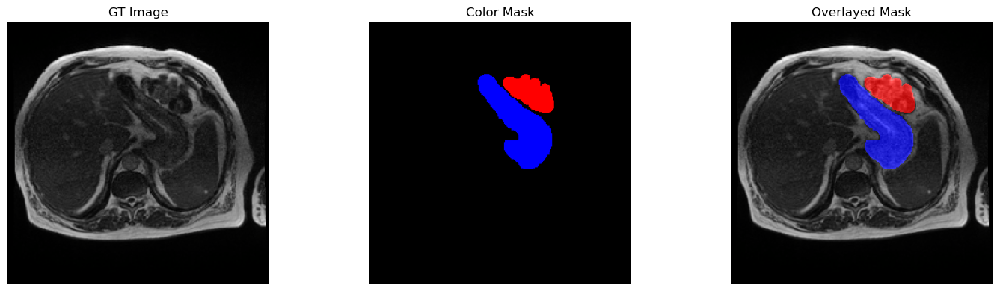

In [10]:
for batch_images, batch_masks in valid_loader:
 
    batch_images = denormalize(batch_images, mean=DatasetConfig.MEAN, std=DatasetConfig.STD).permute(0, 2, 3, 1).numpy()
    batch_masks  = batch_masks.numpy()
 
    print("batch_images shape:", batch_images.shape)
    print("batch_masks shape: ", batch_masks.shape)
     
    display_image_and_mask(images=batch_images, masks=batch_masks)
 
    break

In [11]:
def get_model(*, model_name, num_classes):
    model = SegformerForSemanticSegmentation.from_pretrained(
        model_name,
        num_labels=num_classes,
        ignore_mismatched_sizes=True,
    )
    return model

In [12]:
model = get_model(model_name=TrainingConfig.MODEL_NAME, num_classes=DatasetConfig.NUM_CLASSES)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b4-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([4, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [13]:
data    = torch.randn(1, 3, *DatasetConfig.IMAGE_SIZE[::-1])
target = torch.rand(1, *DatasetConfig.IMAGE_SIZE[::-1]).to(torch.long)

In [14]:
outputs = model(pixel_values=data, labels=target, return_dict=True)
 
# Upsample model outputs to match input image size.
upsampled_logits = F.interpolate(outputs["logits"], size=target.shape[-2:], mode="bilinear", align_corners=False)


In [15]:
print("Model Outputs: outputs['logits']:", outputs["logits"].shape)
print("Model Outputs Resized::", upsampled_logits.shape)
print("Loss: outputs['loss']:", outputs["loss"])

Model Outputs: outputs['logits']: torch.Size([1, 4, 72, 72])
Model Outputs Resized:: torch.Size([1, 4, 288, 288])
Loss: outputs['loss']: tensor(1.4527, grad_fn=<NllLoss2DBackward0>)


In [16]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
summary(model, input_size=(1, 3, *DatasetConfig.IMAGE_SIZE[::-1]), depth=2, device=device)


Layer (type:depth-idx)                                                      Output Shape              Param #
SegformerForSemanticSegmentation                                            [1, 4, 72, 72]            --
├─SegformerModel: 1-1                                                       [1, 64, 72, 72]           --
│    └─SegformerEncoder: 2-1                                                [1, 64, 72, 72]           60,842,688
├─SegformerDecodeHead: 1-2                                                  [1, 4, 72, 72]            --
│    └─ModuleList: 2-2                                                      --                        789,504
│    └─Conv2d: 2-3                                                          [1, 768, 72, 72]          2,359,296
│    └─BatchNorm2d: 2-4                                                     [1, 768, 72, 72]          1,536
│    └─ReLU: 2-5                                                            [1, 768, 72, 72]          --
│    └─Dropout: 2-6        

In [17]:
def dice_coef_loss(predictions, ground_truths, num_classes=2, dims=(1, 2), smooth=1e-8):
    """Smooth Dice coefficient + Cross-entropy loss function."""
 
    ground_truth_oh = F.one_hot(ground_truths, num_classes=num_classes)
    prediction_norm = F.softmax(predictions, dim=1).permute(0, 2, 3, 1)
 
    intersection = (prediction_norm * ground_truth_oh).sum(dim=dims)
    summation = prediction_norm.sum(dim=dims) + ground_truth_oh.sum(dim=dims)
 
    dice = (2.0 * intersection + smooth) / (summation + smooth)
    dice_mean = dice.mean()
 
    CE = F.cross_entropy(predictions, ground_truths)
 
    return (1.0 - dice_mean) + CE

In [18]:
class MedicalSegmentationModel(pl.LightningModule):
    def __init__(
        self,
        model_name: str,
        num_classes: int = 10,
        init_lr: float = 0.001,
        optimizer_name: str = "Adam",
        weight_decay: float = 1e-4,
        use_scheduler: bool = False,
        scheduler_name: str = "multistep_lr",
        num_epochs: int = 100,
    ):
        super().__init__()
 
        # Save the arguments as hyperparameters.
        self.save_hyperparameters()
 
        # Loading model using the function defined above.
        self.model = get_model(model_name=self.hparams.model_name, num_classes=self.hparams.num_classes)
 
        # Initializing the required metric objects.
        self.mean_train_loss = MeanMetric()
        self.mean_train_f1 = MulticlassF1Score(num_classes=self.hparams.num_classes, average="macro")
        self.mean_valid_loss = MeanMetric()
        self.mean_valid_f1 = MulticlassF1Score(num_classes=self.hparams.num_classes, average="macro")
 
    def forward(self, data):
        outputs = self.model(pixel_values=data, return_dict=True)
        upsampled_logits = F.interpolate(outputs["logits"], size=data.shape[-2:], mode="bilinear", align_corners=False)
        return upsampled_logits
     
    def training_step(self, batch, *args, **kwargs):
        data, target = batch
        logits = self(data)
 
        # Calculate Combo loss (Segmentation specific loss (Dice) + cross entropy)
        loss = dice_coef_loss(logits, target, num_classes=self.hparams.num_classes)
         
        self.mean_train_loss(loss, weight=data.shape[0])
        self.mean_train_f1(logits.detach(), target)
 
        self.log("train/batch_loss", self.mean_train_loss, prog_bar=True, logger=False)
        self.log("train/batch_f1", self.mean_train_f1, prog_bar=True, logger=False)
        return loss
 
    def on_train_epoch_end(self):
        # Computing and logging the training mean loss & mean f1.
        self.log("train/loss", self.mean_train_loss, prog_bar=True)
        self.log("train/f1", self.mean_train_f1, prog_bar=True)
        self.log("epoch", self.current_epoch)
 
    def validation_step(self, batch, *args, **kwargs):
        data, target = batch
        logits = self(data)
         
        # Calculate Combo loss (Segmentation specific loss (Dice) + cross entropy)
        loss = dice_coef_loss(logits, target, num_classes=self.hparams.num_classes)
 
        self.mean_valid_loss.update(loss, weight=data.shape[0])
        self.mean_valid_f1.update(logits, target)
 
    def on_validation_epoch_end(self):
         
        # Computing and logging the validation mean loss & mean f1.
        self.log("valid/loss", self.mean_valid_loss, prog_bar=True)
        self.log("valid/f1", self.mean_valid_f1, prog_bar=True)
        self.log("epoch", self.current_epoch)
 
    def configure_optimizers(self):
        optimizer = getattr(torch.optim, self.hparams.optimizer_name)(
            filter(lambda p: p.requires_grad, self.model.parameters()),
            lr=self.hparams.init_lr,
            weight_decay=self.hparams.weight_decay,
        )
 
        LR = self.hparams.init_lr
        WD = self.hparams.weight_decay
 
        if self.hparams.optimizer_name in ("AdamW", "Adam"):
            optimizer = getattr(torch.optim, self.hparams.optimizer_name)(model.parameters(), lr=LR, 
                                                                          weight_decay=WD, amsgrad=True)
        else:
            optimizer = optim.SGD(model.parameters(), lr=LR, weight_decay=WD)
 
        if self.hparams.use_scheduler:
            lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[self.trainer.max_epochs // 2,], gamma=0.1)
 
            # The lr_scheduler_config is a dictionary that contains the scheduler
            # and its associated configuration.
            lr_scheduler_config = {"scheduler": lr_scheduler, "interval": "epoch", "name": "multi_step_lr"}
            return {"optimizer": optimizer, "lr_scheduler": lr_scheduler_config}
 
        else:
            return optimizer

In [19]:
# Seed everything for reproducibility.
pl.seed_everything(42, workers=True)
 
# Intialize custom model.
model = MedicalSegmentationModel(
    model_name=TrainingConfig.MODEL_NAME,
    num_classes=DatasetConfig.NUM_CLASSES,
    init_lr=TrainingConfig.INIT_LR,
    optimizer_name=TrainingConfig.OPTIMIZER_NAME,
    weight_decay=TrainingConfig.WEIGHT_DECAY,
    use_scheduler=TrainingConfig.USE_SCHEDULER,
    scheduler_name=TrainingConfig.SCHEDULER,
    num_epochs=TrainingConfig.NUM_EPOCHS,
) 
 
# Initialize custom data module.
data_module = MedicalSegmentationDataModule(
    num_classes=DatasetConfig.NUM_CLASSES,
    img_size=DatasetConfig.IMAGE_SIZE,
    ds_mean=DatasetConfig.MEAN,
    ds_std=DatasetConfig.STD,
    batch_size=TrainingConfig.BATCH_SIZE,
    num_workers=TrainingConfig.NUM_WORKERS,
    pin_memory=torch.cuda.is_available(),
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b4-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([4, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [20]:
# Creating ModelCheckpoint callback. 
# We'll save the model on basis on validation f1-score.
model_checkpoint = ModelCheckpoint(
    monitor="valid/f1",
    mode="max",
    filename="ckpt_{epoch:03d}-vloss_{valid/loss:.4f}_vf1_{valid/f1:.4f}",
    auto_insert_metric_name=False,
)
 
# Creating a learning rate monitor callback which will be plotted/added in the default logger.
lr_rate_monitor = LearningRateMonitor(logging_interval="epoch")

In [21]:
wandb_logger = WandbLogger(log_model=True, project="UM_medical_segmentation")

In [22]:
# # Initializing the Trainer class object.
# trainer = pl.Trainer(
#     accelerator="auto",  # Auto select the best hardware accelerator available
#     devices="auto",  # Auto select available devices for the accelerator (For eg. mutiple GPUs)
#     strategy="auto",  # Auto select the distributed training strategy.
#     max_epochs=TrainingConfig.NUM_EPOCHS,  # Maximum number of epoch to train for.
#     enable_model_summary=False,  # Disable printing of model summary as we are using torchinfo.
#     callbacks=[model_checkpoint, lr_rate_monitor],  # Declaring callbacks to use.
#     precision="16-mixed",  # Using Mixed Precision training.
#     logger=wandb_logger
# )
 
# # Start training
# trainer.fit(model, data_module)

In [23]:
import os
import torch
from transformers import SegformerForSemanticSegmentation
from dataclasses import dataclass


@dataclass
class Configs:
    NUM_CLASSES = 4
    MODEL_PATH: str = "nvidia/segformer-b4-finetuned-ade-512-512"
        
def get_model(*, model_path, num_classes):
    model = SegformerForSemanticSegmentation.from_pretrained(
        model_path,
        num_labels=num_classes,
        ignore_mismatched_sizes=True,
    )
    return model

model_SegFormer = get_model(model_path=Configs.MODEL_PATH, num_classes=Configs.NUM_CLASSES)
model_state_dict = model_SegFormer.state_dict()

print()
for i, (key, val) in enumerate(model_state_dict.items()):
    print(key)
    if i == 5:
        breakmodel = get_model(model_path=Configs.MODEL_PATH, num_classes=Configs.NUM_CLASSES)
model_state_dict = model_SegFormer.state_dict()

print()
for i, (key, val) in enumerate(model_state_dict.items()):
    print(key)
    if i == 5:
        break
        
CKPT = torch.load("E:/adv_attk/notebooks/artifacts/model-fpgquxev-v0/model.ckpt")
print(CKPT.keys())

TRAINED_CKPT_state_dict = CKPT["state_dict"]

for i, (key, val) in enumerate(TRAINED_CKPT_state_dict.items()):
    print(key)
    if i == 5:
        break
        
        
from collections import OrderedDict

new_state_dict = OrderedDict()

for key_name, value in CKPT["state_dict"].items():
    new_state_dict[key_name.replace("model.", "")] = value
model_SegFormer.load_state_dict(new_state_dict)

model_SegFormer

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b4-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([4, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



segformer.encoder.patch_embeddings.0.proj.weight
segformer.encoder.patch_embeddings.0.proj.bias
segformer.encoder.patch_embeddings.0.layer_norm.weight
segformer.encoder.patch_embeddings.0.layer_norm.bias
segformer.encoder.patch_embeddings.1.proj.weight
segformer.encoder.patch_embeddings.1.proj.bias


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b4-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([4, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


segformer.encoder.patch_embeddings.1.layer_norm.weight
segformer.encoder.patch_embeddings.1.layer_norm.bias
segformer.encoder.patch_embeddings.2.proj.weight
segformer.encoder.patch_embeddings.2.proj.bias
segformer.encoder.patch_embeddings.2.layer_norm.weight
segformer.encoder.patch_embeddings.2.layer_norm.bias
segformer.encoder.patch_embeddings.3.proj.weight
segformer.encoder.patch_embeddings.3.proj.bias
segformer.encoder.patch_embeddings.3.layer_norm.weight
segformer.encoder.patch_embeddings.3.layer_norm.bias
segformer.encoder.block.0.0.layer_norm_1.weight
segformer.encoder.block.0.0.layer_norm_1.bias
segformer.encoder.block.0.0.attention.self.query.weight
segformer.encoder.block.0.0.attention.self.query.bias
segformer.encoder.block.0.0.attention.self.key.weight
segformer.encoder.block.0.0.attention.self.key.bias
segformer.encoder.block.0.0.attention.self.value.weight
segformer.encoder.block.0.0.attention.self.value.bias
segformer.encoder.block.0.0.attention.self.sr.weight
segformer.e

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'loops', 'callbacks', 'optimizer_states', 'lr_schedulers', 'MixedPrecisionPlugin', 'hparams_name', 'hyper_parameters'])
model.segformer.encoder.patch_embeddings.0.proj.weight
model.segformer.encoder.patch_embeddings.0.proj.bias
model.segformer.encoder.patch_embeddings.0.layer_norm.weight
model.segformer.encoder.patch_embeddings.0.layer_norm.bias
model.segformer.encoder.patch_embeddings.1.proj.weight
model.segformer.encoder.patch_embeddings.1.proj.bias


SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)

In [24]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [25]:
def image_overlay(image, segmented_image, alpha=1.0, beta=0.7, gamma=0.0):
    # Ensure both images are in the same color space
    if len(segmented_image.shape) == 2 or segmented_image.shape[2] == 1:
        segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_GRAY2RGB)
    if image.shape[2] == 1:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # Resize segmented_image to match image dimensions if necessary
    if image.shape[:2] != segmented_image.shape[:2]:
        segmented_image = cv2.resize(segmented_image, (image.shape[1], image.shape[0]))

    # Convert to BGR for cv2.addWeighted
    image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    segmented_image_bgr = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    # Perform the weighted addition
    overlaid_image_bgr = cv2.addWeighted(image_bgr, alpha, segmented_image_bgr, beta, gamma)

    # Convert back to RGB
    overlaid_image = cv2.cvtColor(overlaid_image_bgr, cv2.COLOR_BGR2RGB)

    return np.clip(overlaid_image, 0.0, 1.0)



In [26]:
import torch.nn.functional as F

@torch.inference_mode()
def inference(model, loader, img_size, device=device):
    num_batches_to_process = InferenceConfig.NUM_BATCHES

    for idx, (batch_img, batch_mask) in enumerate(loader):
        predictions = model(batch_img.to(device))
        
        # Ensure predictions are upsampled to match input image size
        pred_all = F.interpolate(predictions.logits, size=batch_img.shape[2:], mode='bilinear', align_corners=False).argmax(dim=1).cpu().numpy()

        batch_img = denormalize(batch_img.cpu(), mean=DatasetConfig.MEAN, std=DatasetConfig.STD)
        batch_img = batch_img.permute(0, 2, 3, 1).numpy()

        if idx == num_batches_to_process:
            break

        for i in range(len(batch_img)):
            fig = plt.figure(figsize=(20, 8))

            # Display the original image.
            ax1 = fig.add_subplot(1, 4, 1)
            ax1.imshow(batch_img[i])
            ax1.set_title("Actual frame")
            plt.axis("off")

            # Display the ground truth mask.
            true_mask_rgb = num_to_rgb(batch_mask[i], color_map=id2color)
            ax2 = fig.add_subplot(1, 4, 2)
            ax2.set_title("Ground truth labels")
            ax2.imshow(true_mask_rgb)
            plt.axis("off")

            # Display the predicted segmentation mask.
            pred_mask_rgb = num_to_rgb(pred_all[i], color_map=id2color)
            ax3 = fig.add_subplot(1, 4, 3)
            ax3.set_title("Predicted labels")
            ax3.imshow(pred_mask_rgb)
            plt.axis("off")

            # Display the predicted segmentation mask overlayed on the original image.
            overlayed_image = image_overlay(batch_img[i], pred_mask_rgb)
            ax4 = fig.add_subplot(1, 4, 4)
            ax4.set_title("Overlayed image")
            ax4.imshow(overlayed_image)
            plt.axis("off")
            plt.show()


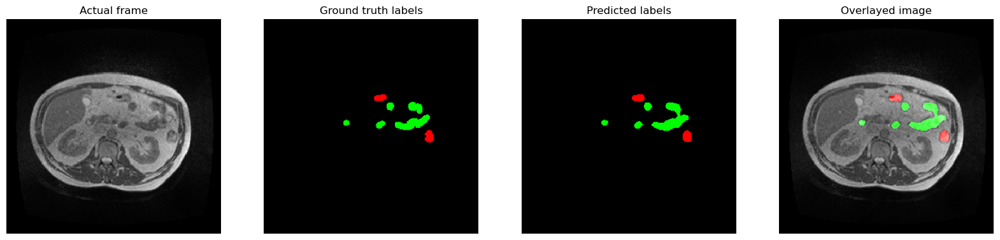

In [27]:

DEVICE = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model_SegFormer.to(DEVICE)
model_SegFormer.eval()
 
inference(model_SegFormer, valid_loader, device=DEVICE, img_size=DatasetConfig.IMAGE_SIZE)


In [28]:
model = model_SegFormer

In [28]:
import torch
from torch import nn
import torch.nn.functional as F

from torch.utils.data import DataLoader, random_split
import albumentations as A

import segmentation_models_pytorch as smp
# import torchsummary

import pandas as pd
import numpy as np
import random, shutil, time, os

import sklearn
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

from glob import glob
from tqdm.notebook import tqdm
from sklearn.model_selection import KFold, GroupKFold
from sklearn.metrics import roc_auc_score
# from skimage import color
from IPython import display as ipd

import scipy
import pdb
import gc

import torchattacks
import monai

from pytorch_grad_cam import GradCAM


from torch.cuda import amp
from matplotlib.ticker import LogFormatter, ScalarFormatter
import warnings
warnings.filterwarnings('ignore')

print('done')

done


In [29]:
def imshow(img, return_only=False, pause=False, show_axis=True):
    if isinstance(img, np.ndarray):
        if len(img.shape) == 4:
            img = img[0]
        if img.shape[0] == 3:
            img = img.transpose(2,1,0)

    if isinstance(img, torch.Tensor):
        if len(img.shape) == 4:
            img = img.cpu().detach()[0].numpy().transpose(2,1,0)
        elif len(img.shape) == 3:
            if img.shape[0] == 3:
                img = img.cpu().detach().numpy().transpose(2,1,0)
        elif len(img.shape) == 2:
            img = img.cpu().detach().numpy()

    if return_only:
        return img
    else:
#         plt.figure(figsize=(5,5))
        plt.subplots()
        plt.imshow(img)
        if pause:
            plt.pause(1)
        if not show_axis:
            plt.axis('off')

In [30]:
import os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, f1_score, accuracy_score
from matplotlib.ticker import LogFormatter, ScalarFormatter

# 颜色映射
id2color = {
    0: (0, 0, 0),    # background
    1: (0, 0, 255),  # large bowel (red)
    2: (0, 255, 0),  # small bowel (green)
    3: (255, 0, 0)   # stomach (blue)
}

def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

def denormalize(image, mean, std):
    mean = torch.tensor(mean).reshape(1, 3, 1, 1)
    std = torch.tensor(std).reshape(1, 3, 1, 1)
    return image * std + mean

def onehot_to_rgb(mask, id2color):
    rgb_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for id, color in id2color.items():
        rgb_mask[mask == id] = color
    return rgb_mask

def get_image_and_mask_by_index(index, img_dir, msk_dir):
    img_files = sorted(os.listdir(img_dir))
    msk_files = sorted(os.listdir(msk_dir))
#     print(type(img_files))
#     print(img_files.index("case124_day0_slice_0091_266_266_1.50_1.50.png"))
    img_file = img_files[index]
#     print(img_file)
    msk_file = msk_files[index]
#     print(msk_file)
    
    img_path = os.path.join(img_dir, img_file)
    msk_path = os.path.join(msk_dir, msk_file)
    
    image = cv2.imread(img_path)
    mask = cv2.imread(msk_path, cv2.IMREAD_GRAYSCALE)
    
    return image, mask, img_path, msk_path

def compute_metrics(true_mask, pred_mask, num_classes=4):
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy


# FGSM attack perturbation budget -- SegFormer

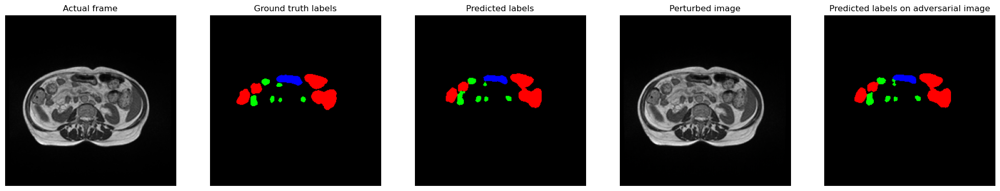

Epsilon: 0.0001 | IoU: 0.7070 | F1 Score: 0.8156


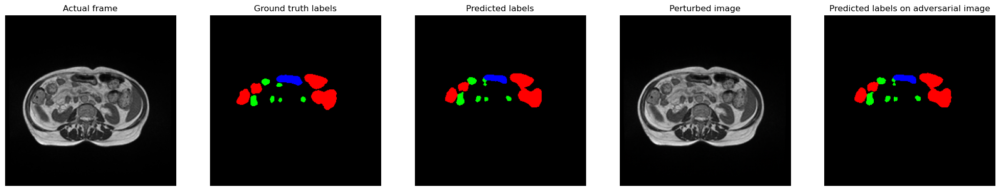

Epsilon: 0.001 | IoU: 0.6943 | F1 Score: 0.8057


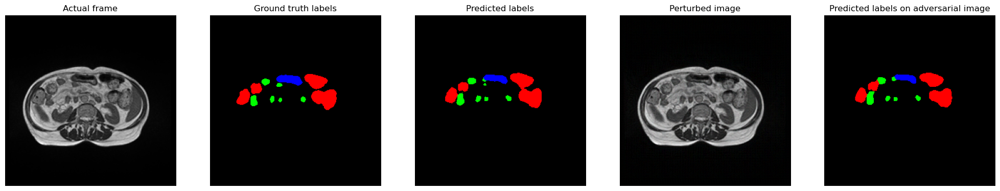

Epsilon: 0.01 | IoU: 0.6251 | F1 Score: 0.7475


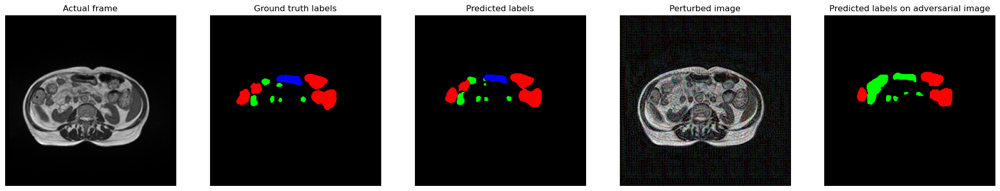

Epsilon: 0.1 | IoU: 0.4054 | F1 Score: 0.4782


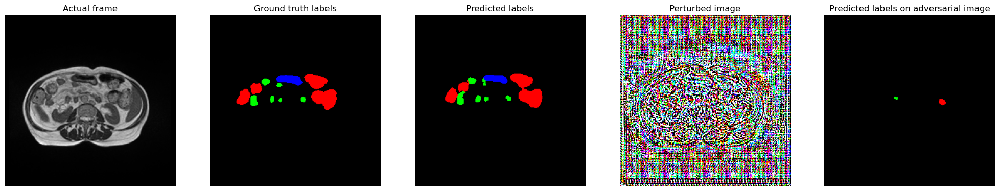

Epsilon: 1 | IoU: 0.2532 | F1 Score: 0.2709


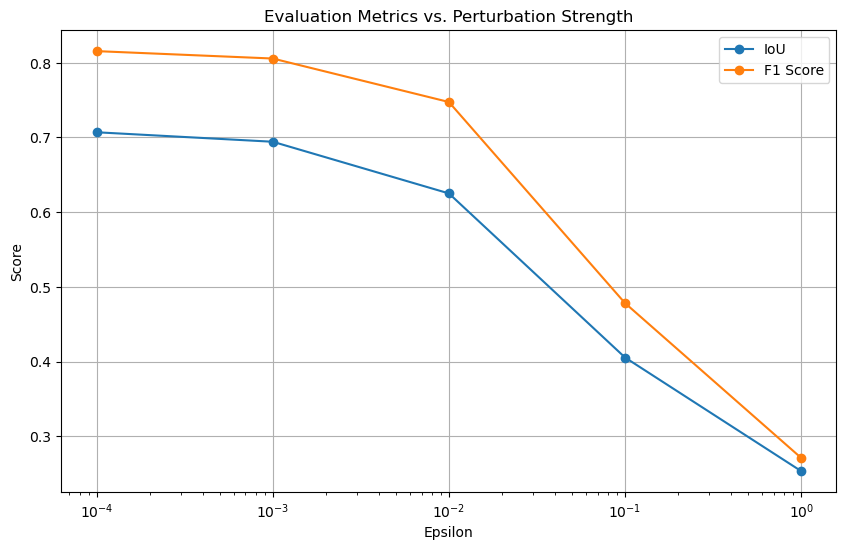

In [35]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

def inference_with_fgsm_attack(model, image, mask, img_path, msk_path, device, epsilon):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)

    image.requires_grad = True
    
    outputs = model(image)
    pred = outputs.logits
    
    pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
    loss = F.cross_entropy(pred_resized, mask)
    
    model.zero_grad()
    loss.backward()
    
    data_grad = image.grad.data
    perturbed_data = fgsm_attack(image, epsilon, data_grad)
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(perturbed_data).logits
    
    pred_resized = F.interpolate(pred, size=image.shape[2:], mode='bilinear', align_corners=False).argmax(dim=1).cpu().numpy()
    pred_adv_resized = F.interpolate(pred_adv, size=image.shape[2:], mode='bilinear', align_corners=False).argmax(dim=1).cpu().numpy()
    
    image = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    perturbed_data = perturbed_data.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    image_flipped = np.fliplr(image[0])
    perturbed_data_flipped = np.fliplr(perturbed_data[0])
    true_mask_rgb = np.fliplr(onehot_to_rgb(mask.cpu().detach().numpy()[0], id2color))
    pred_mask_rgb = np.fliplr(onehot_to_rgb(pred_resized[0], id2color))
    pred_adv_mask_rgb = np.fliplr(onehot_to_rgb(pred_adv_resized[0], id2color))
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(image_flipped)
    ax1.set_title('Actual frame')
    plt.axis('off')
    
    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data_flipped)
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized[0])
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon_values = [0.0001, 0.001, 0.01, 0.1, 1]


index = 3215  
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)


iou_scores = []
f1_scores = []
accuracies = []


for eps in epsilon_values:
    iou, f1, accuracy = inference_with_fgsm_attack(model_SegFormer, image, mask, img_path, msk_path, device=DEVICE, epsilon=eps)
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Epsilon: {eps} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(epsilon_values, iou_scores, label='IoU', marker='o')
plt.plot(epsilon_values, f1_scores, label='F1 Score', marker='o')
plt.xscale('log')
plt.xlabel('Epsilon')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Perturbation Strength')
plt.legend()
plt.grid(True)
plt.show()


In [31]:
import matplotlib.pyplot as plt
import logging

logging.basicConfig(level='INFO')

mlogger = logging.getLogger('matplotlib')
mlogger.setLevel(logging.WARNING)

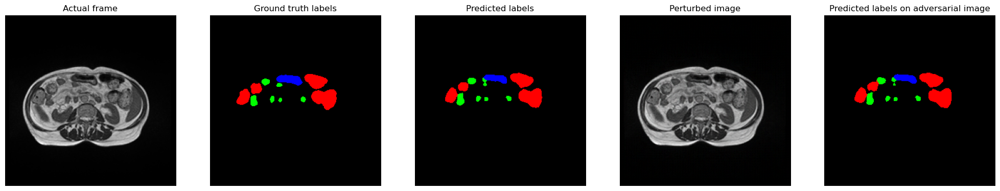

Iterations: 1 | IoU: 0.6654 | F1 Score: 0.7824


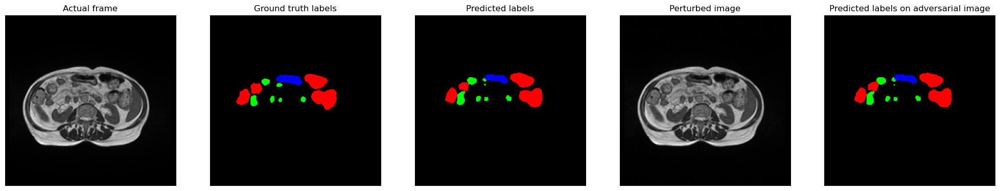

Iterations: 5 | IoU: 0.6628 | F1 Score: 0.7796


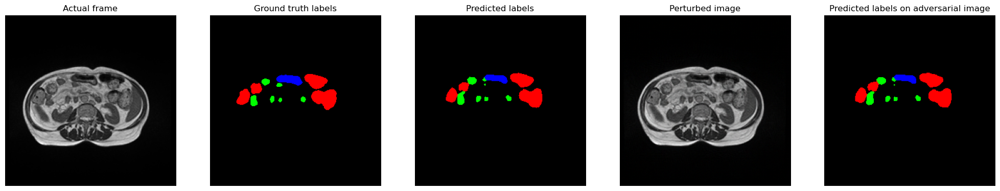

Iterations: 10 | IoU: 0.6635 | F1 Score: 0.7803


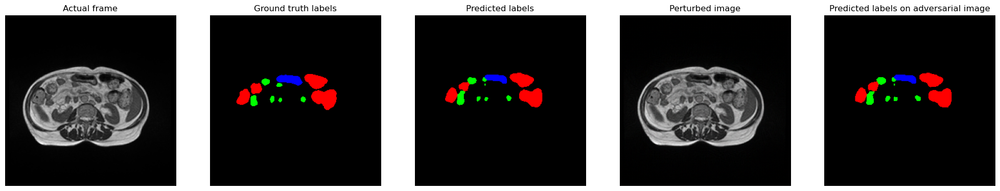

Iterations: 20 | IoU: 0.6608 | F1 Score: 0.7780


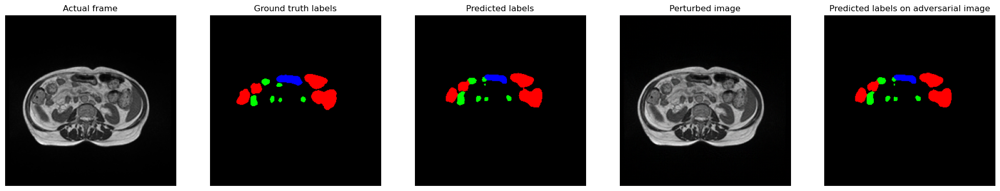

Iterations: 40 | IoU: 0.6583 | F1 Score: 0.7755


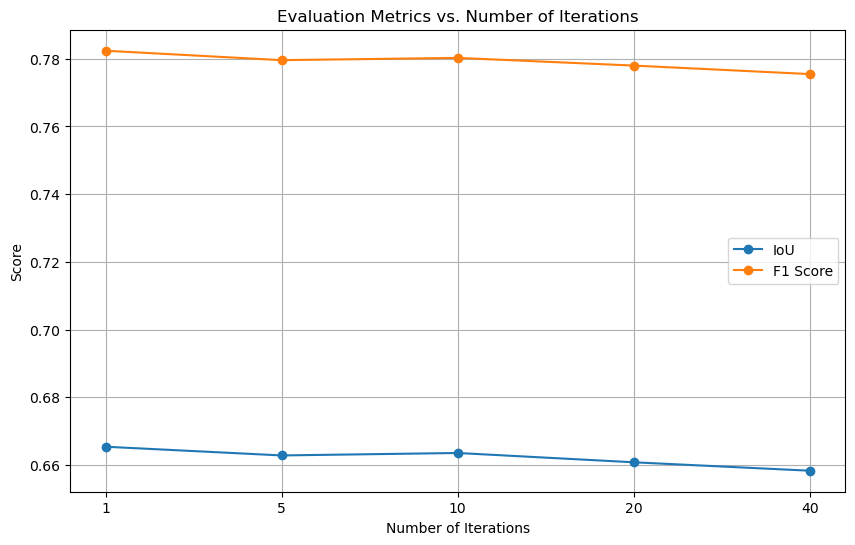

In [32]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

def inference_with_iterative_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iterations):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)

    perturbed_image = image.clone().detach()
    perturbed_image.requires_grad = True

    for _ in range(num_iterations):
        outputs = model(perturbed_image)
        pred = outputs.logits
        
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = perturbed_image.grad.data
        perturbed_image = perturbed_image + alpha * data_grad.sign()
        perturbed_image = torch.clamp(perturbed_image, image - epsilon, image + epsilon)
        perturbed_image = torch.clamp(perturbed_image, 0, 1)
        perturbed_image = perturbed_image.detach()  # Detach from the current graph
        perturbed_image.requires_grad = True       # Re-enable gradient computation
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(perturbed_image).logits
    
    pred_resized = F.interpolate(pred, size=image.shape[2:], mode='bilinear', align_corners=False).argmax(dim=1).cpu().numpy()
    pred_adv_resized = F.interpolate(pred_adv, size=image.shape[2:], mode='bilinear', align_corners=False).argmax(dim=1).cpu().numpy()
    
    image = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    perturbed_image = perturbed_image.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    image_flipped = np.fliplr(image[0])
    perturbed_image_flipped = np.fliplr(perturbed_image[0])
    true_mask_rgb = np.fliplr(onehot_to_rgb(mask.cpu().detach().numpy()[0], id2color))
    pred_mask_rgb = np.fliplr(onehot_to_rgb(pred_resized[0], id2color))
    pred_adv_mask_rgb = np.fliplr(onehot_to_rgb(pred_adv_resized[0], id2color))
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(image_flipped)
    ax1.set_title('Actual frame')
    plt.axis('off')
    
    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_image_flipped)
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized[0])
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon = 0.005  
alpha = 0.1    
iterations_values = [1, 5, 10, 20, 40]


index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)


iou_scores = []
f1_scores = []
accuracies = []

for num_iterations in iterations_values:
    iou, f1, accuracy = inference_with_iterative_attack(model_SegFormer, image, mask, img_path, msk_path, device=DEVICE, epsilon=epsilon, alpha=alpha, num_iterations=num_iterations)
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Iterations: {num_iterations} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")

    
iterations_values = list(map(str, iterations_values))
plt.figure(figsize=(10, 6))
plt.plot(iterations_values, iou_scores, label='IoU', marker='o')
plt.plot(iterations_values, f1_scores, label='F1 Score', marker='o')
plt.xlabel('Number of Iterations')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Number of Iterations')
plt.legend()
plt.grid(True)
plt.show()

# PGD attack -- SegFormer

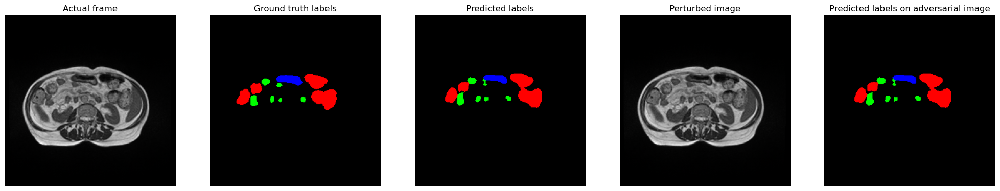

Epsilon: 0.0001 | IoU: 0.7043 | F1 Score: 0.8137


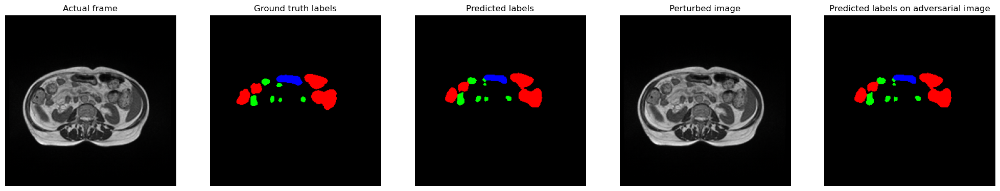

Epsilon: 0.001 | IoU: 0.6963 | F1 Score: 0.8075


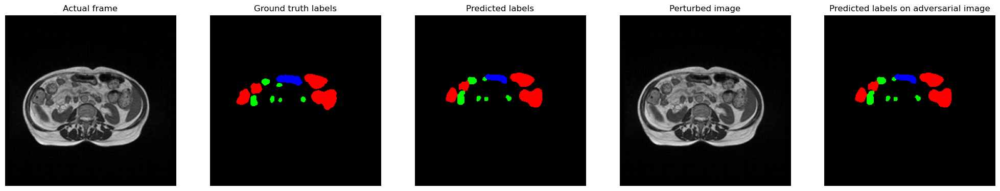

Epsilon: 0.01 | IoU: 0.6275 | F1 Score: 0.7492


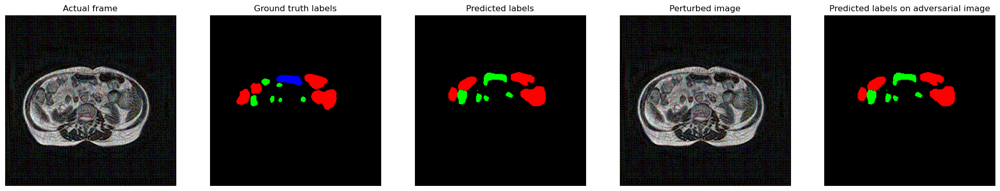

Epsilon: 0.1 | IoU: 0.3868 | F1 Score: 0.4583


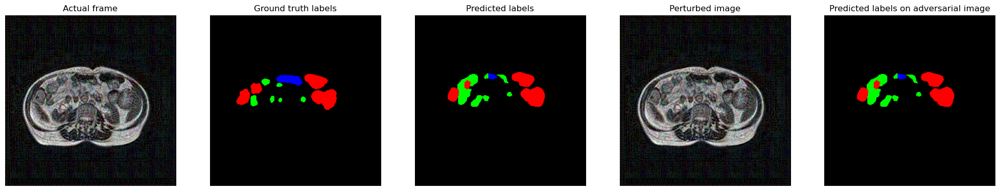

Epsilon: 1 | IoU: 0.4401 | F1 Score: 0.5437


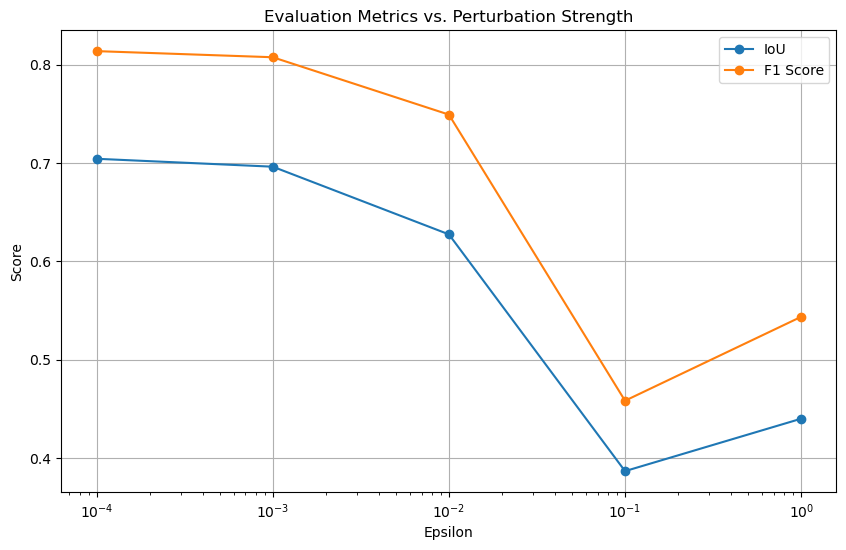

In [36]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def pgd_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        perturbed_data = image + alpha * data_grad.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

def compute_metrics(true_mask, pred_mask, num_classes=4):
    from sklearn.metrics import jaccard_score, f1_score, accuracy_score
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon_values = [0.0001, 0.001, 0.01, 0.1, 1]
alpha = 0.1
num_iter = 1
index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for eps in epsilon_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    image, pred_adv, mask = pgd_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=eps, alpha=alpha, num_iter=num_iter)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    
    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)
    
    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(np.fliplr(orig_image))
    ax1.set_title('Actual frame')
    plt.axis('off')
    
    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(np.fliplr(true_mask_rgb))
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(np.fliplr(pred_mask_rgb))
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(np.fliplr(perturbed_data[0]))
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(np.fliplr(pred_adv_mask_rgb))
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Epsilon: {eps} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(epsilon_values, iou_scores, label='IoU', marker='o')
plt.plot(epsilon_values, f1_scores, label='F1 Score', marker='o')
plt.xscale('log')
plt.xlabel('Epsilon')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Perturbation Strength')
plt.legend()
plt.grid(True)
plt.show()


# PGD attack strength - Segformer

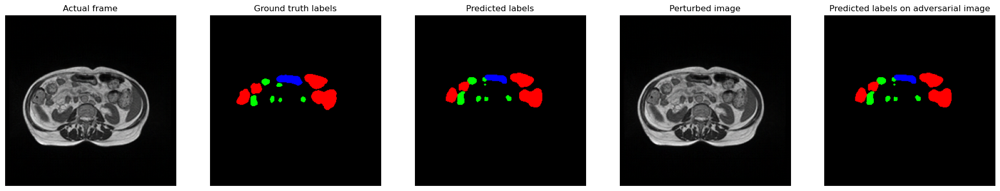

Iterations: 1 | IoU: 0.6599 | F1 Score: 0.7774 | Accuracy: 0.9806


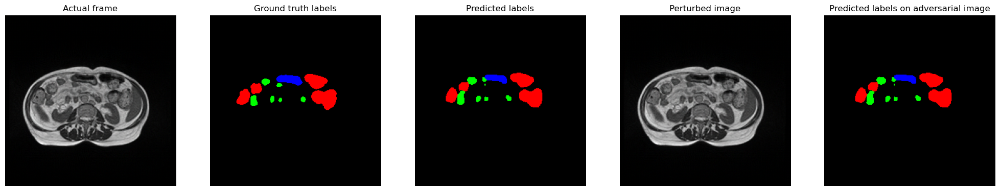

Iterations: 5 | IoU: 0.6595 | F1 Score: 0.7766 | Accuracy: 0.9807


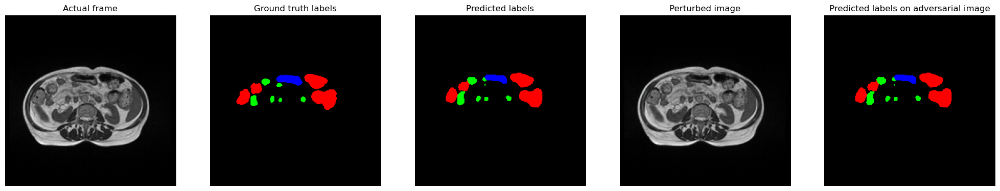

Iterations: 10 | IoU: 0.6608 | F1 Score: 0.7780 | Accuracy: 0.9808


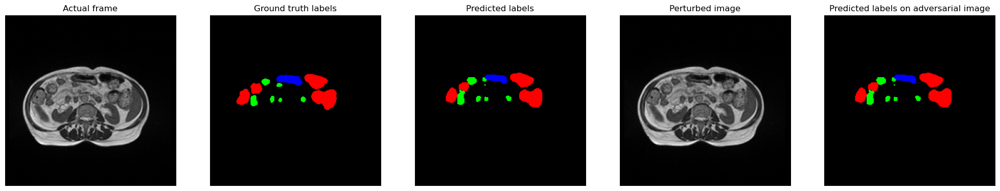

Iterations: 20 | IoU: 0.6597 | F1 Score: 0.7768 | Accuracy: 0.9808


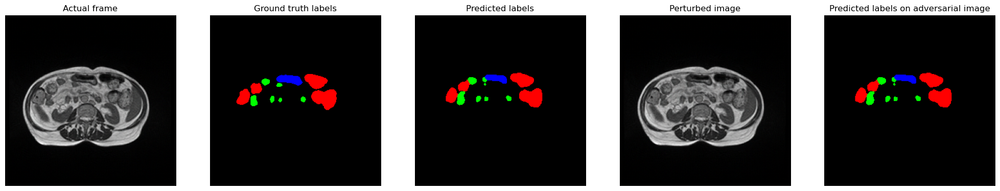

Iterations: 40 | IoU: 0.6591 | F1 Score: 0.7764 | Accuracy: 0.9808


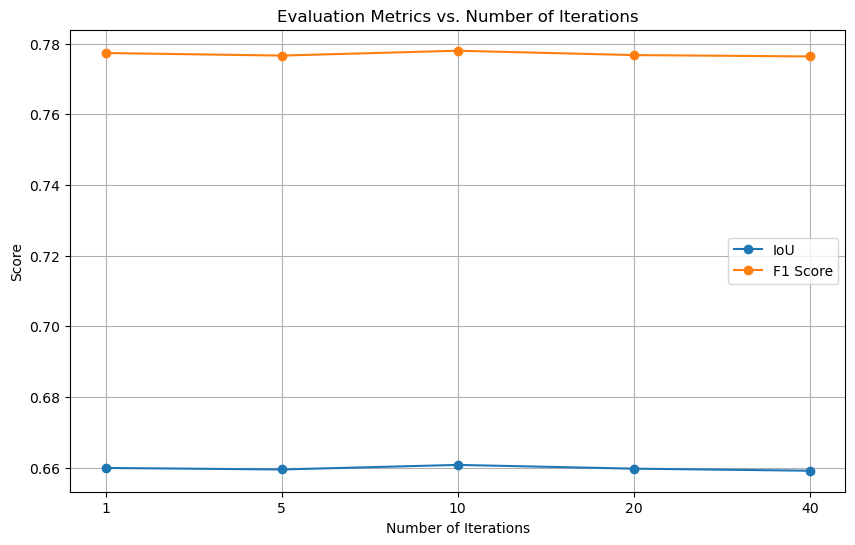

In [33]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def pgd_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        perturbed_data = image + alpha * data_grad.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

def compute_metrics(true_mask, pred_mask, num_classes=4):
    from sklearn.metrics import jaccard_score, f1_score, accuracy_score
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon = 0.005
alpha = 0.1
iterations_values = [1, 5, 10, 20, 40]
index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for num_iter in iterations_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    image, pred_adv, mask = pgd_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=epsilon, alpha=alpha, num_iter=num_iter)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    
    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)
    
    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(np.fliplr(orig_image))
    ax1.set_title('Actual frame')
    plt.axis('off')
    
    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(np.fliplr(true_mask_rgb))
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(np.fliplr(pred_mask_rgb))
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(np.fliplr(perturbed_data[0]))
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(np.fliplr(pred_adv_mask_rgb))
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Iterations: {num_iter} | IoU: {iou:.4f} | F1 Score: {f1:.4f} | Accuracy: {accuracy:.4f}")
    
iterations_values = list(map(str, iterations_values))
plt.figure(figsize=(10, 6))
plt.plot(iterations_values, iou_scores, label='IoU', marker='o')
plt.plot(iterations_values, f1_scores, label='F1 Score', marker='o')
plt.xlabel('Number of Iterations')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Number of Iterations')
plt.legend()
plt.grid(True)
plt.show()


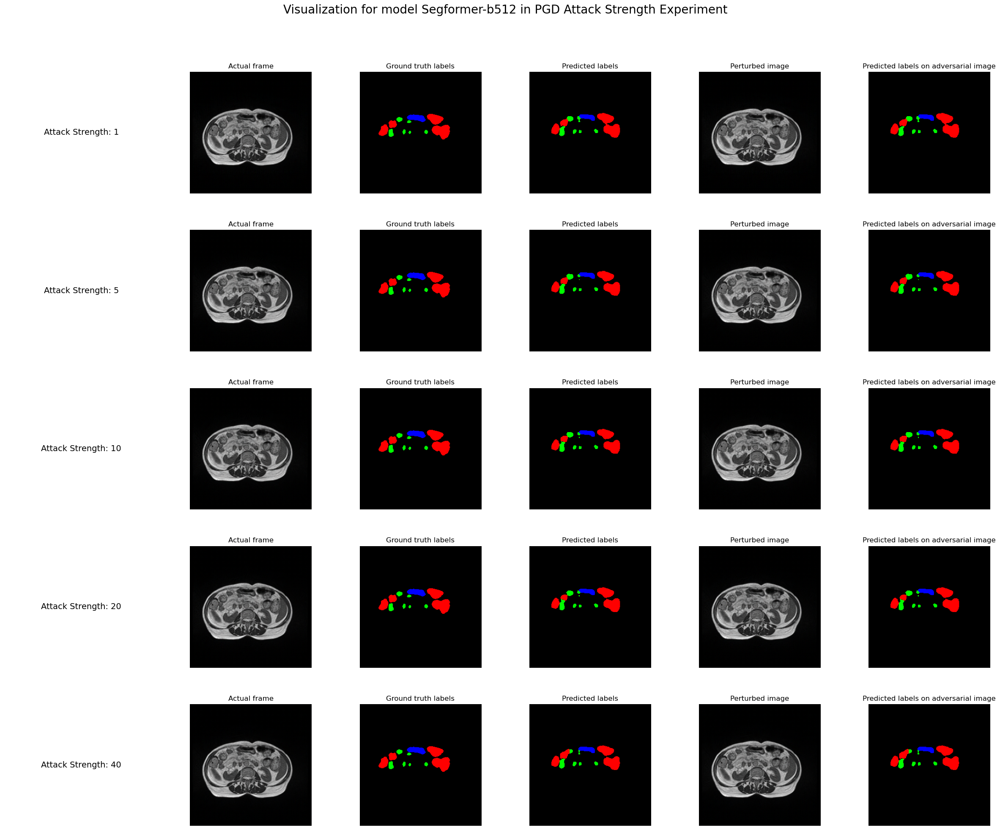

In [36]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def pgd_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        perturbed_data = image + alpha * data_grad.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon = 0.005
alpha = 0.1
iterations_values = [1, 5, 10, 20, 40]

index = 3215 
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)


fig, axes = plt.subplots(5, 6, figsize=(24, 20))


fig.suptitle('Visualization for model Segformer-b512 in PGD Attack Strength Experiment', fontsize=20)


plt.subplots_adjust(wspace=0.4, hspace=0.4)


for i, num_iter in enumerate(iterations_values):
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    image, pred_adv, mask = pgd_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=epsilon, alpha=alpha, num_iter=num_iter)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    
    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)
    
    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()

    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    axes[i, 0].text(0.5, 0.5, f'Attack Strength: {num_iter}', ha='center', va='center', fontsize=14)
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(np.fliplr(orig_image))
    axes[i, 1].set_title('Actual frame')
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(np.fliplr(true_mask_rgb))
    axes[i, 2].set_title('Ground truth labels')
    axes[i, 2].axis('off')
    
    axes[i, 3].imshow(np.fliplr(pred_mask_rgb))
    axes[i, 3].set_title('Predicted labels')
    axes[i, 3].axis('off')
    
    axes[i, 4].imshow(np.fliplr(perturbed_data[0]))
    axes[i, 4].set_title('Perturbed image')
    axes[i, 4].axis('off')
    
    axes[i, 5].imshow(np.fliplr(pred_adv_mask_rgb))
    axes[i, 5].set_title('Predicted labels on adversarial image')
    axes[i, 5].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(top=0.9, hspace=0.3, wspace=0.1)
plt.show()


# BIM attack -- SegFormer (Perturbation Budget)

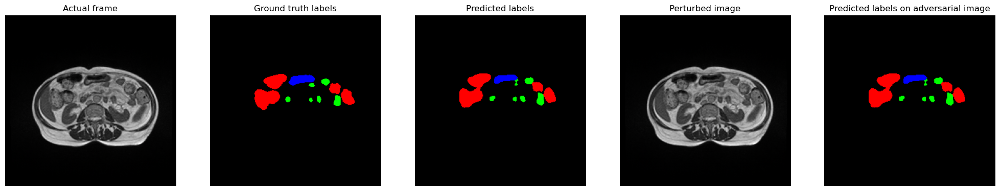

Epsilon: 0.0001 | IoU: 0.7048 | F1 Score: 0.8142


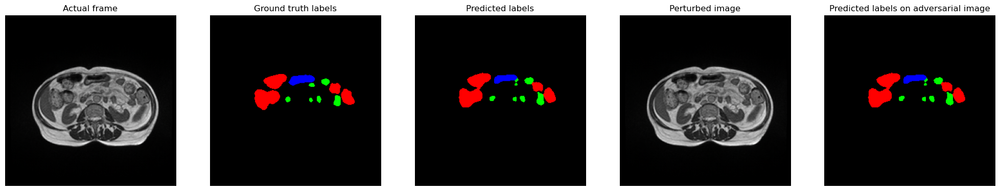

Epsilon: 0.001 | IoU: 0.6964 | F1 Score: 0.8076


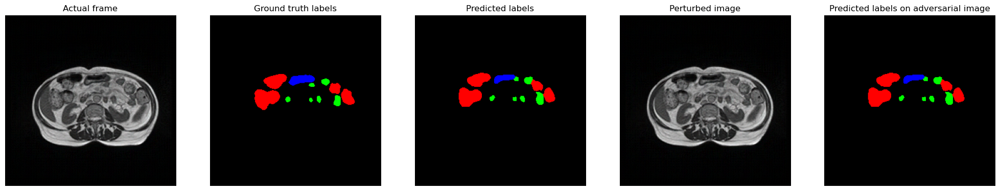

Epsilon: 0.01 | IoU: 0.6216 | F1 Score: 0.7439


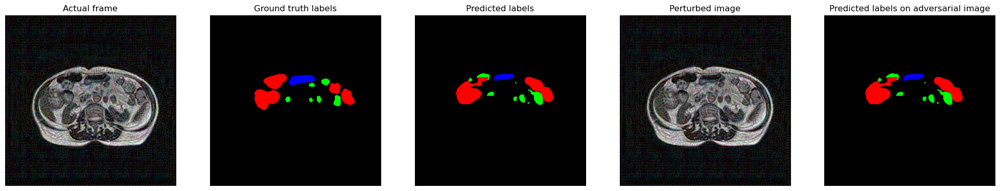

Epsilon: 0.1 | IoU: 0.4665 | F1 Score: 0.5839


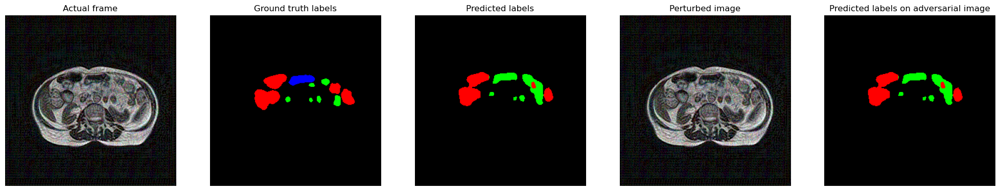

Epsilon: 1 | IoU: 0.3963 | F1 Score: 0.4692


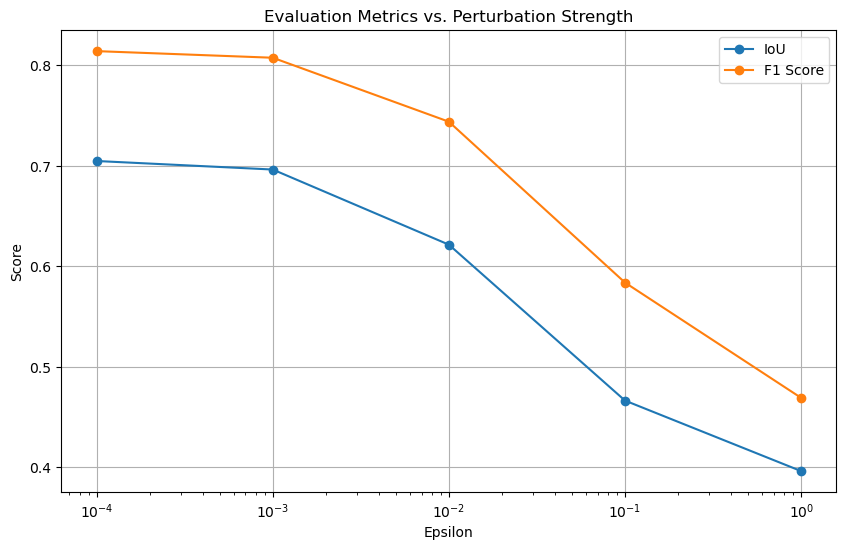

In [37]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def bim_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        perturbed_data = image + alpha * data_grad.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach_()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

def compute_metrics(true_mask, pred_mask, num_classes=4):
    from sklearn.metrics import jaccard_score, f1_score, accuracy_score
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon_values = [0.0001, 0.001, 0.01, 0.1, 1]
alpha = 0.1
num_iter = 1

index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []


for eps in epsilon_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

    image, pred_adv, mask = bim_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=eps, alpha=alpha, num_iter=num_iter)

    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)

    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)
    
    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(orig_image)
    ax1.set_title('Actual frame')
    plt.axis('off')

    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data[0])
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Epsilon: {eps} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(epsilon_values, iou_scores, label='IoU', marker='o')
plt.plot(epsilon_values, f1_scores, label='F1 Score', marker='o')
plt.xscale('log')
plt.xlabel('Epsilon')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Perturbation Strength')
plt.legend()
plt.grid(True)
plt.show()

# BIM attack -- Segformer(Attack strength)

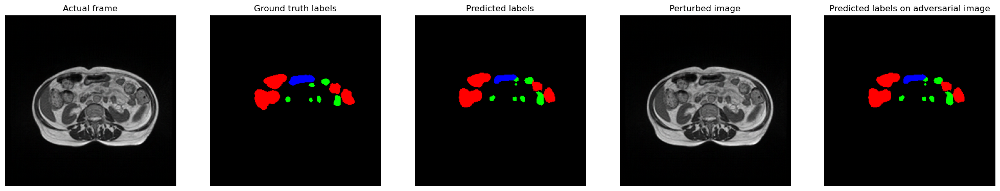

Iteration: 1 | IoU: 0.6624 | F1 Score: 0.7798 |


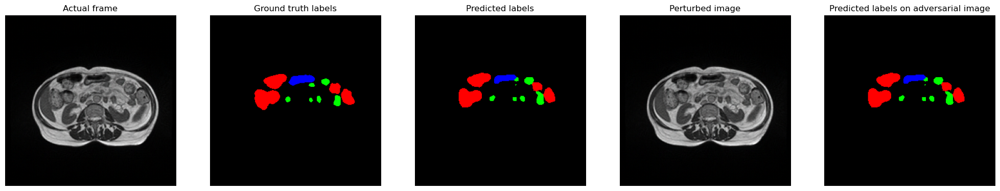

Iteration: 5 | IoU: 0.6616 | F1 Score: 0.7787 |


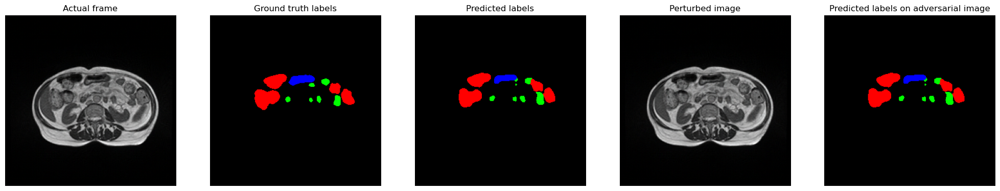

Iteration: 10 | IoU: 0.6633 | F1 Score: 0.7797 |


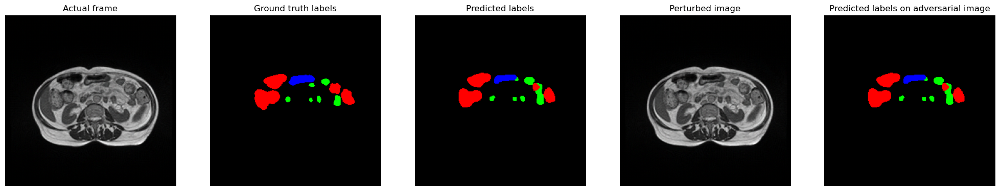

Iteration: 20 | IoU: 0.6525 | F1 Score: 0.7697 |


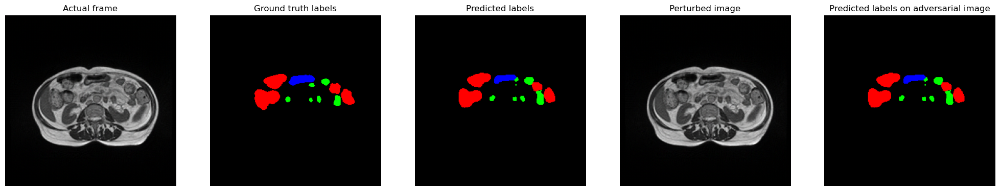

Iteration: 40 | IoU: 0.6608 | F1 Score: 0.7777 |


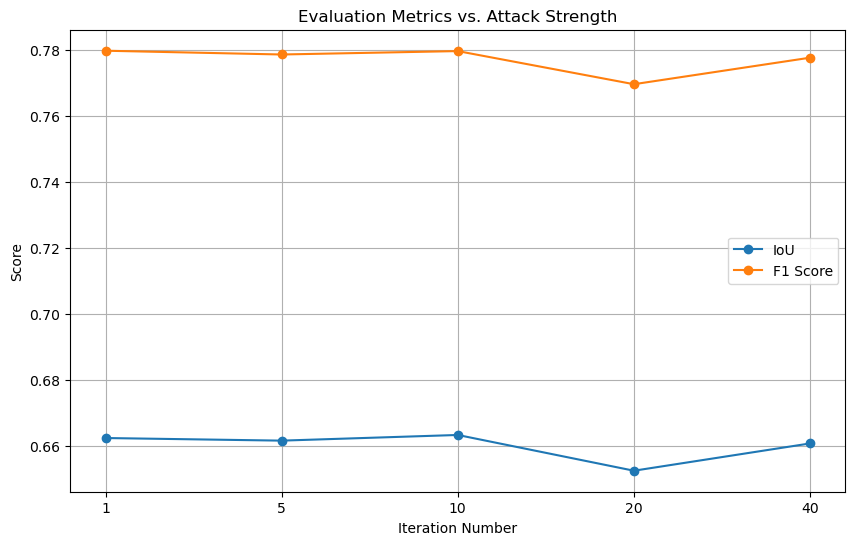

In [38]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def bim_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        perturbed_data = image + alpha * data_grad.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach_()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

iteration_values = [1, 5, 10, 20, 40]
alpha = 0.1
epsilon = 0.005

index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for num_iter in iteration_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

    image, pred_adv, mask = bim_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=epsilon, alpha=alpha, num_iter=num_iter)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    

    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)

    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()

    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))

    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(orig_image)
    ax1.set_title('Actual frame')
    plt.axis('off')

    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')

    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')

    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data[0])
    plt.axis('off')

    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Iteration: {num_iter} | IoU: {iou:.4f} | F1 Score: {f1:.4f} |")
iteration_values = list(map(str, iteration_values))
plt.figure(figsize=(10, 6))
plt.plot(iteration_values, iou_scores, label='IoU', marker='o')
plt.plot(iteration_values, f1_scores, label='F1 Score', marker='o')
plt.xlabel('Iteration Number')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Attack Strength')
plt.legend()
plt.grid(True)
plt.show()


# MIM attack -- SegFormer

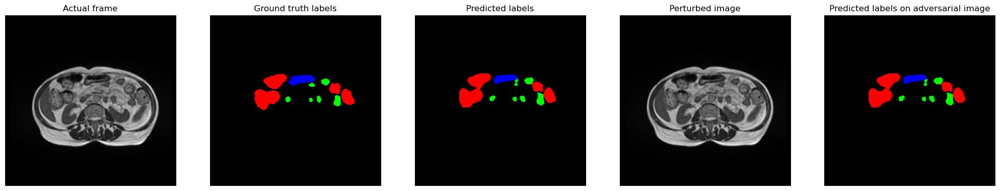

Epsilon: 0.0001 | IoU: 0.7079 | F1 Score: 0.8164


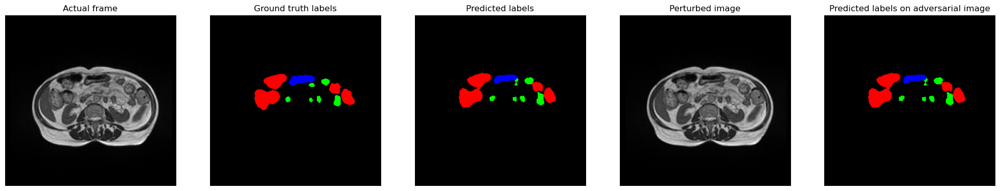

Epsilon: 0.001 | IoU: 0.6953 | F1 Score: 0.8066


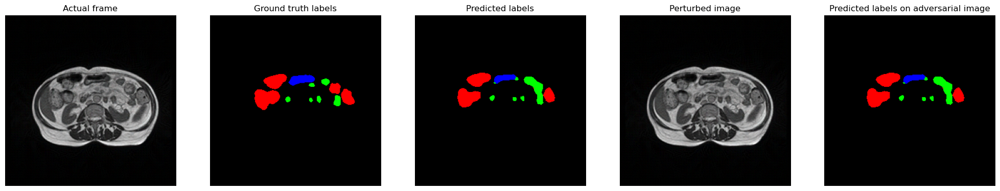

Epsilon: 0.01 | IoU: 0.5914 | F1 Score: 0.7140


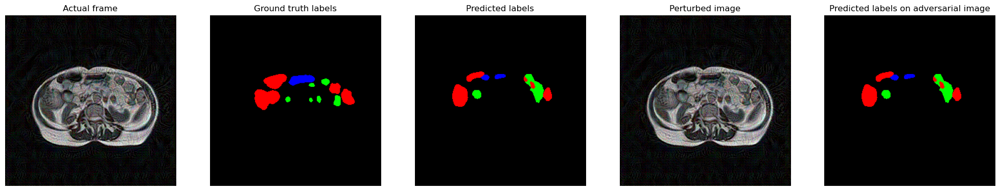

Epsilon: 0.1 | IoU: 0.3319 | F1 Score: 0.4077


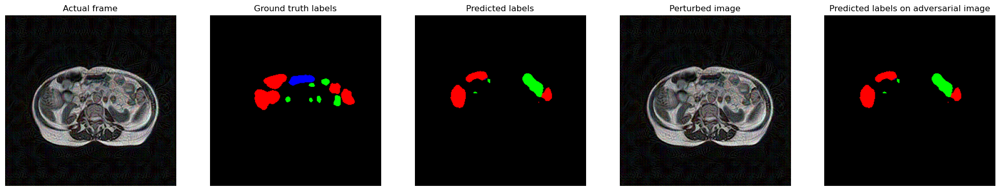

Epsilon: 1 | IoU: 0.3118 | F1 Score: 0.3710


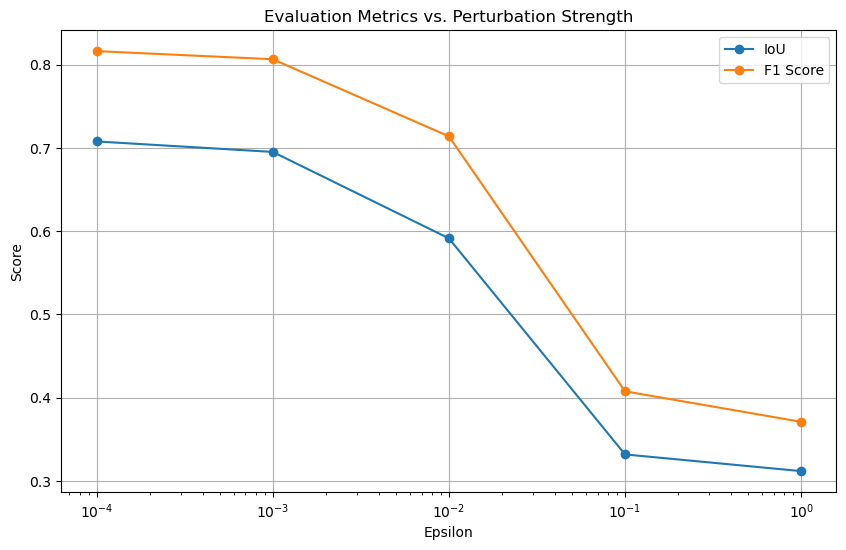

In [39]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def mim_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter, decay_factor):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    momentum = torch.zeros_like(image).to(device)
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        data_grad = data_grad / torch.mean(torch.abs(data_grad), dim=(1, 2, 3), keepdim=True)
        momentum = decay_factor * momentum + data_grad
        perturbed_data = image + alpha * momentum.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach_()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

def compute_metrics(true_mask, pred_mask, num_classes=4):
    from sklearn.metrics import jaccard_score, f1_score, accuracy_score
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon_values = [0.0001, 0.001, 0.01, 0.1, 1]
alpha = 0.01
num_iter = 10
decay_factor = 1.0

index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for eps in epsilon_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    
    image, pred_adv, mask = mim_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=eps, alpha=alpha, num_iter=num_iter, decay_factor=decay_factor)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    
    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)
    
    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(orig_image)
    ax1.set_title('Actual frame')
    plt.axis('off')
    
    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data[0])
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Epsilon: {eps} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(epsilon_values, iou_scores, label='IoU', marker='o')
plt.plot(epsilon_values, f1_scores, label='F1 Score', marker='o')
plt.xscale('log')
plt.xlabel('Epsilon')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Perturbation Strength')
plt.legend()
plt.grid(True)
plt.show()


# MIM attack -- SegFormer (Attack Strength)

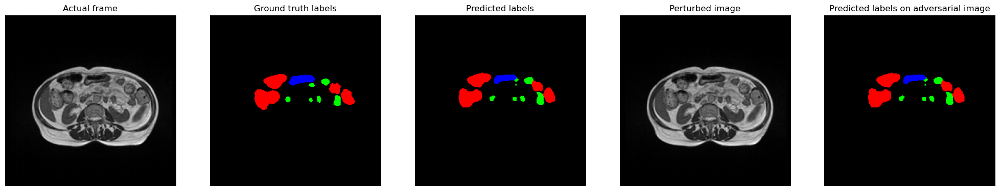

Iteration: 1 | IoU: 0.6652 | F1 Score: 0.7817


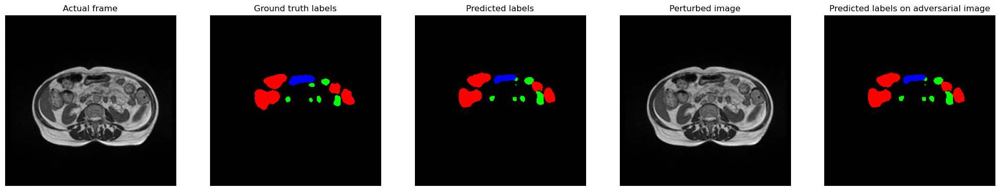

Iteration: 5 | IoU: 0.6604 | F1 Score: 0.7777


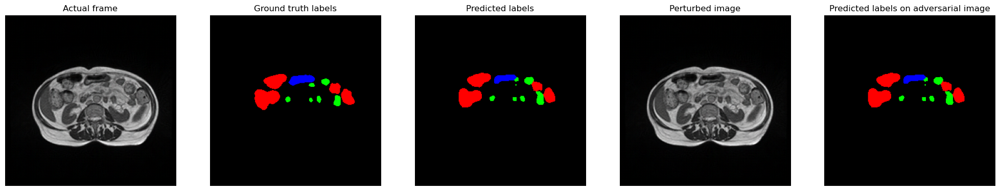

Iteration: 10 | IoU: 0.6582 | F1 Score: 0.7757


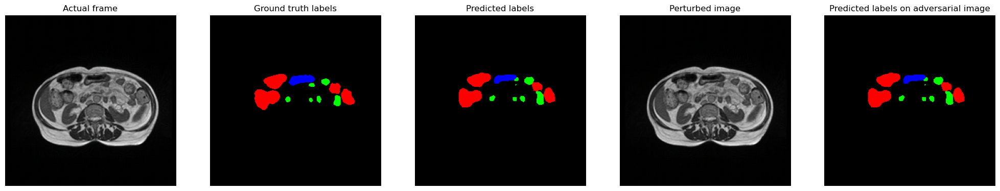

Iteration: 20 | IoU: 0.6592 | F1 Score: 0.7767


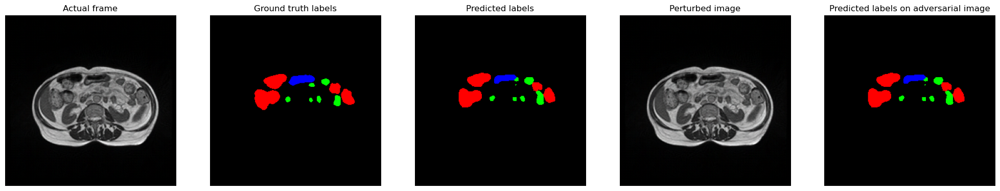

Iteration: 40 | IoU: 0.6583 | F1 Score: 0.7759


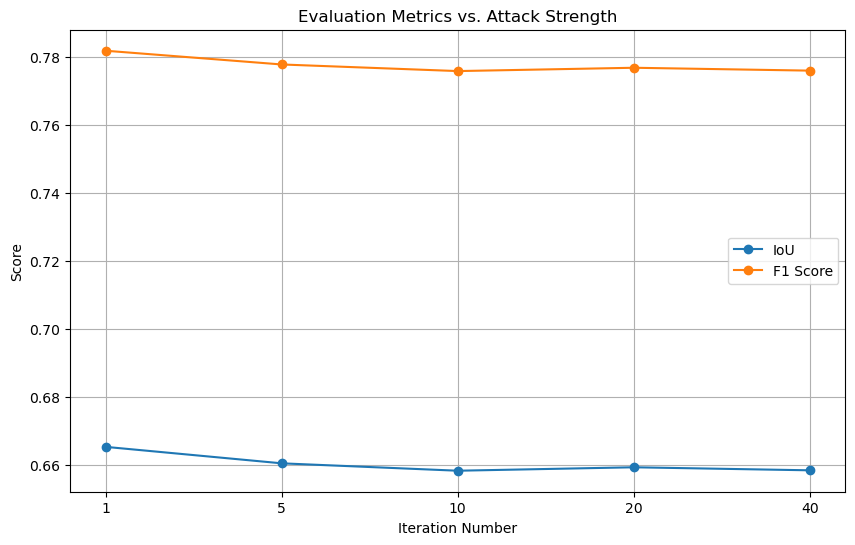

In [40]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def mim_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter, decay_factor):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    momentum = torch.zeros_like(image).to(device)
    
    for i in range(num_iter):
        image.requires_grad = True
        outputs = model(image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        data_grad = data_grad / torch.mean(torch.abs(data_grad), dim=(1, 2, 3), keepdim=True)
        momentum = decay_factor * momentum + data_grad
        perturbed_data = image + alpha * momentum.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach_()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

iteration_values = [1, 5, 10, 20, 40]
alpha = 0.1
epsilon = 0.005
decay_factor = 1.0

index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for num_iter in iteration_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    
    image, pred_adv, mask = mim_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=epsilon, alpha=alpha, num_iter=num_iter, decay_factor=decay_factor)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    
    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)

    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()

    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))

    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(orig_image)
    ax1.set_title('Actual frame')
    plt.axis('off')

    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')

    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')

    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data[0])
    plt.axis('off')

    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Iteration: {num_iter} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")
iteration_values = list(map(str, iteration_values))
plt.figure(figsize=(10, 6))
plt.plot(iteration_values, iou_scores, label='IoU', marker='o')
plt.plot(iteration_values, f1_scores, label='F1 Score', marker='o')
plt.xlabel('Iteration Number')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Attack Strength')
plt.legend()
plt.grid(True)
plt.show()


# DIM attack -- SegFormer

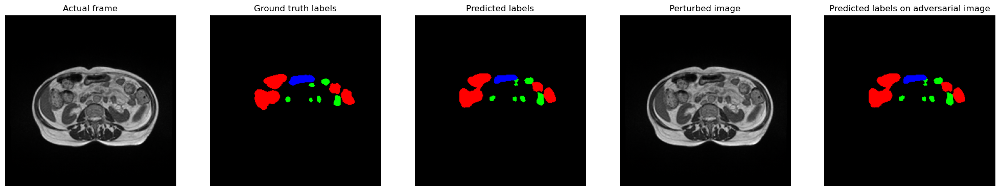

Epsilon: 0.0001 | IoU: 0.7061 | F1 Score: 0.8148


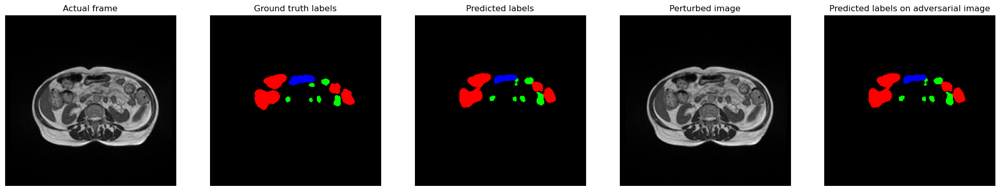

Epsilon: 0.001 | IoU: 0.6961 | F1 Score: 0.8070


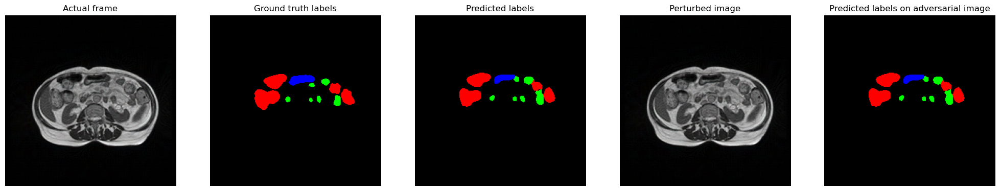

Epsilon: 0.01 | IoU: 0.6132 | F1 Score: 0.7358


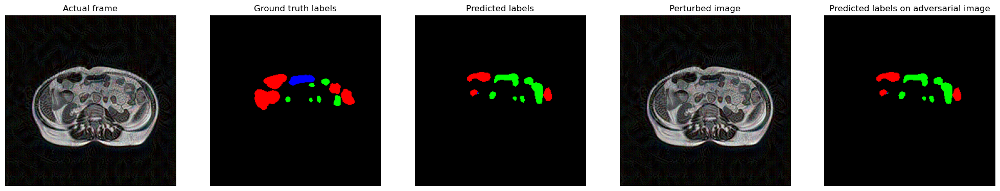

Epsilon: 0.1 | IoU: 0.3367 | F1 Score: 0.4059


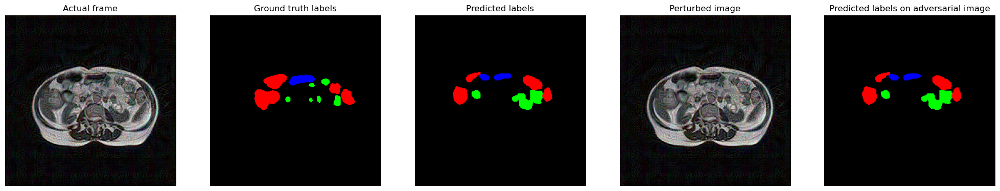

Epsilon: 1 | IoU: 0.3580 | F1 Score: 0.4490


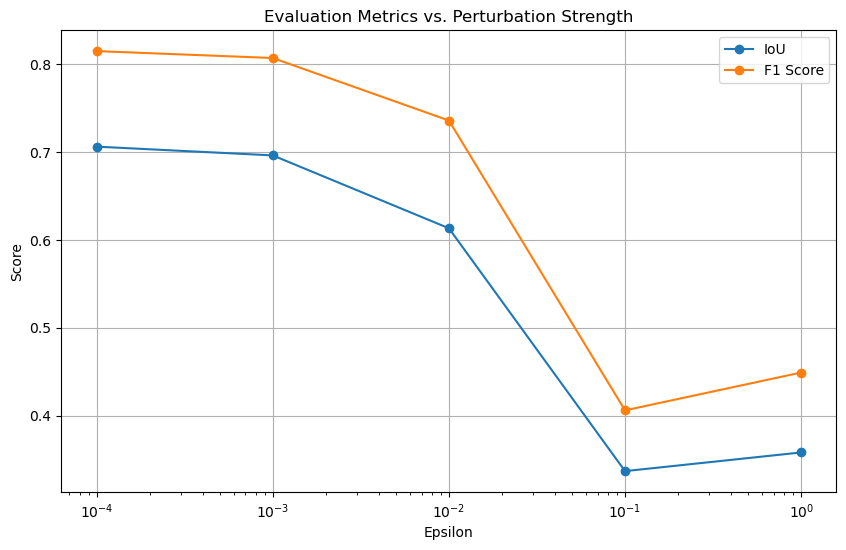

In [41]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def dim_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter, diversity_prob):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    momentum = torch.zeros_like(image).to(device)
    
    def input_diversity(input_tensor):
        if np.random.rand() < diversity_prob:
            return input_tensor
        else:
            rnd = np.random.randint(299, 330)
            rescaled = F.interpolate(input_tensor, size=[rnd, rnd], mode='bilinear')
            h_rem = 330 - rnd
            w_rem = 330 - rnd
            pad_top = np.random.randint(0, h_rem)
            pad_bottom = h_rem - pad_top
            pad_left = np.random.randint(0, w_rem)
            pad_right = w_rem - pad_left
            padded = F.pad(rescaled, [pad_left, pad_right, pad_top, pad_bottom], mode='constant')
            return padded
    
    for i in range(num_iter):
        image.requires_grad = True
        diversified_image = input_diversity(image)
        outputs = model(diversified_image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        data_grad = data_grad / torch.mean(torch.abs(data_grad), dim=(1, 2, 3), keepdim=True)
        momentum = data_grad + momentum * 1.0
        perturbed_data = image + alpha * momentum.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach_()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

def compute_metrics(true_mask, pred_mask, num_classes=4):
    from sklearn.metrics import jaccard_score, f1_score, accuracy_score
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

epsilon_values = [0.0001, 0.001, 0.01, 0.1, 1]
alpha = 0.01
num_iter = 10
diversity_prob = 0.5

index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for eps in epsilon_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    image, pred_adv, mask = dim_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=eps, alpha=alpha, num_iter=num_iter, diversity_prob=diversity_prob)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)

    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)

    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()

    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))

    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(orig_image)
    ax1.set_title('Actual frame')
    plt.axis('off')

    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')

    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')

    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data[0])
    plt.axis('off')

    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Epsilon: {eps} | IoU: {iou:.4f} | F1 Score: {f1:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(epsilon_values, iou_scores, label='IoU', marker='o')
plt.plot(epsilon_values, f1_scores, label='F1 Score', marker='o')
plt.xscale('log')
plt.xlabel('Epsilon')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Perturbation Strength')
plt.legend()
plt.grid(True)
plt.show()


# DIM attack -- SegFormer (attack strength)

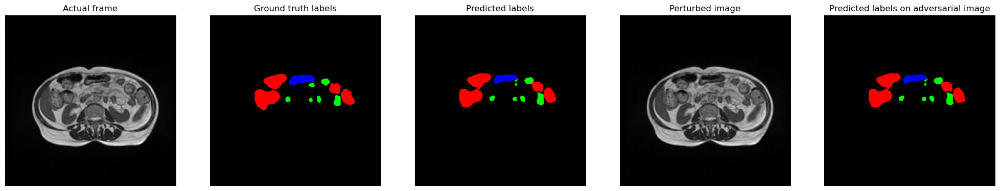

Iteration: 1 | IoU: 0.6968


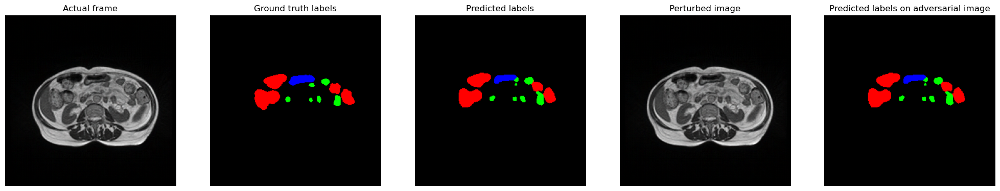

Iteration: 5 | IoU: 0.6702


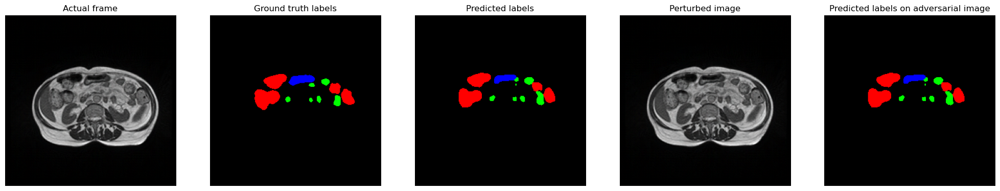

Iteration: 10 | IoU: 0.6629


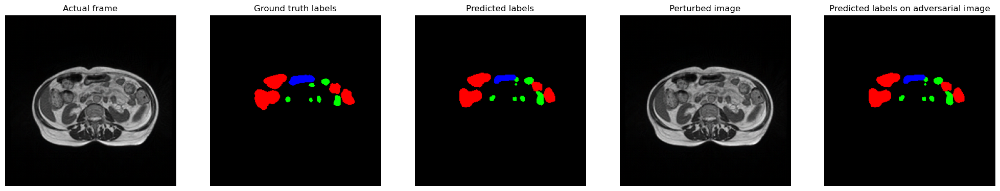

Iteration: 20 | IoU: 0.6609


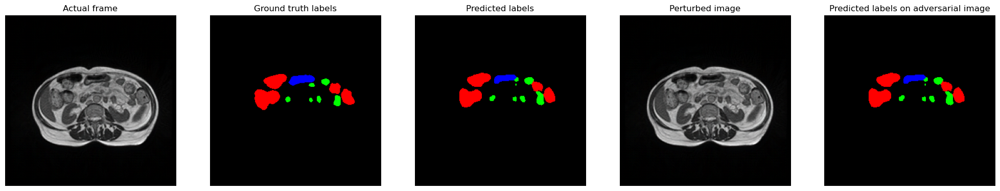

Iteration: 40 | IoU: 0.6666


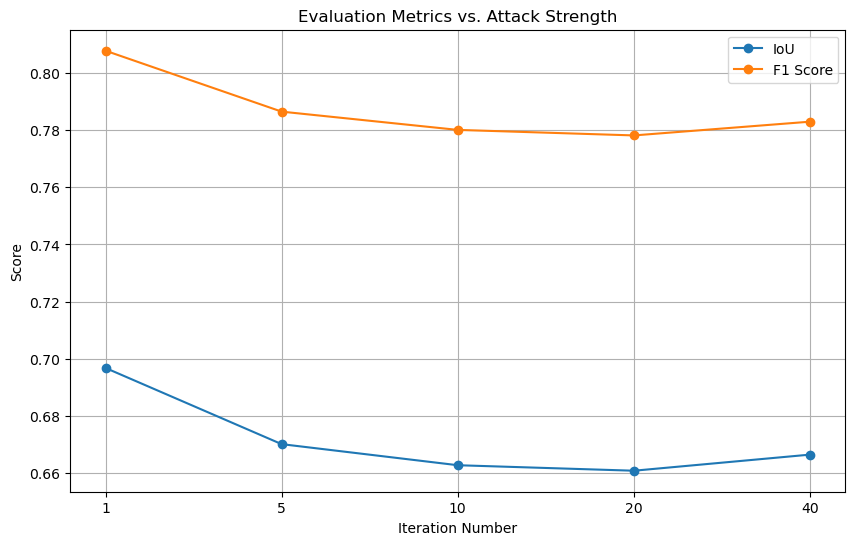

In [42]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import numpy as np

def dim_attack(model, image, mask, img_path, msk_path, device, epsilon, alpha, num_iter, diversity_prob):
    model.train()
    
    image = torch.tensor(image.transpose(2, 0, 1)).float() / 255.0
    mask = torch.tensor(mask).long()
    
    image = image.unsqueeze(0).to(device)
    mask = mask.unsqueeze(0).to(device)
    
    orig_image = image.data.clone()
    momentum = torch.zeros_like(image).to(device)
    
    def input_diversity(input_tensor):
        if np.random.rand() < diversity_prob:
            return input_tensor
        else:
            rnd = np.random.randint(299, 330)
            rescaled = F.interpolate(input_tensor, size=[rnd, rnd], mode='bilinear')
            h_rem = 330 - rnd
            w_rem = 330 - rnd
            pad_top = np.random.randint(0, h_rem)
            pad_bottom = h_rem - pad_top
            pad_left = np.random.randint(0, w_rem)
            pad_right = w_rem - pad_left
            padded = F.pad(rescaled, [pad_left, pad_right, pad_top, pad_bottom], mode='constant')
            return padded
    
    for i in range(num_iter):
        image.requires_grad = True
        diversified_image = input_diversity(image)
        outputs = model(diversified_image)
        pred = outputs.logits
        pred_resized = F.interpolate(pred, size=mask.shape[1:], mode='bilinear', align_corners=False)
        loss = F.cross_entropy(pred_resized, mask)
        
        model.zero_grad()
        loss.backward()
        
        data_grad = image.grad.data
        data_grad = data_grad / torch.mean(torch.abs(data_grad), dim=(1, 2, 3), keepdim=True)
        momentum = data_grad + momentum * 1.0
        perturbed_data = image + alpha * momentum.sign()
        eta = torch.clamp(perturbed_data - orig_image, min=-epsilon, max=epsilon)
        image = torch.clamp(orig_image + eta, min=0, max=1).detach_()
    
    model.eval()
    with torch.no_grad():
        pred_adv = model(image).logits
    
    return image, pred_adv, mask

def onehot_to_rgb(onehot, id2color):
    if len(onehot.shape) == 3:
        single_layer = onehot.argmax(0)
    else:
        single_layer = onehot
    rgb = torch.zeros(3, single_layer.shape[0], single_layer.shape[1], dtype=torch.uint8)
    for label, color in id2color.items():
        mask = single_layer == label
        for i in range(3):
            rgb[i][mask] = color[i]
    return rgb.permute(1, 2, 0).cpu().numpy()

def compute_metrics(true_mask, pred_mask, num_classes=4):
    from sklearn.metrics import jaccard_score, f1_score, accuracy_score
    iou = jaccard_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    f1 = f1_score(true_mask.flatten(), pred_mask.flatten(), average='macro', zero_division=1)
    accuracy = accuracy_score(true_mask.flatten(), pred_mask.flatten())
    return iou, f1, accuracy

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else torch.device("cpu"))

model_SegFormer.to(DEVICE)
model_SegFormer.eval()

iteration_values = [1, 5, 10, 20, 40]
alpha = 0.1
epsilon = 0.005
diversity_prob = 0.5

index = 3215
image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)

iou_scores = []
f1_scores = []
accuracies = []

for num_iter in iteration_values:
    image, mask, img_path, msk_path = get_image_and_mask_by_index(index, ROOT_TRAIN_IMG_DIR, ROOT_TRAIN_MSK_DIR)
    image, pred_adv, mask = dim_attack(model_SegFormer, image, mask, img_path, msk_path, DEVICE, epsilon=epsilon, alpha=alpha, num_iter=num_iter, diversity_prob=diversity_prob)
    
    orig_image = image.squeeze().permute(1, 2, 0).cpu().numpy()
    
    true_mask_rgb = onehot_to_rgb(mask[0].cpu(), id2color)
    
    pred_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_mask_rgb = onehot_to_rgb(pred_resized[0].cpu(), id2color)
    
    perturbed_data = image.permute(0, 2, 3, 1).cpu().detach().numpy()
    
    pred_adv_resized = F.interpolate(pred_adv, size=mask.shape[1:], mode='bilinear', align_corners=False).argmax(dim=1)
    pred_adv_mask_rgb = onehot_to_rgb(pred_adv_resized[0].cpu(), id2color)
    
    fig = plt.figure(figsize=(25, 8))
    
    ax1 = fig.add_subplot(1, 5, 1)
    ax1.imshow(orig_image)
    ax1.set_title('Actual frame')
    plt.axis('off')
    
    ax2 = fig.add_subplot(1, 5, 2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(true_mask_rgb)
    plt.axis('off')
    
    ax3 = fig.add_subplot(1, 5, 3)
    ax3.set_title('Predicted labels')
    ax3.imshow(pred_mask_rgb)
    plt.axis('off')
    
    ax4 = fig.add_subplot(1, 5, 4)
    ax4.set_title('Perturbed image')
    ax4.imshow(perturbed_data[0])
    plt.axis('off')
    
    ax5 = fig.add_subplot(1, 5, 5)
    ax5.set_title('Predicted labels on adversarial image')
    ax5.imshow(pred_adv_mask_rgb)
    plt.axis('off')
    
    plt.show()
    
    iou, f1, accuracy = compute_metrics(mask.cpu().numpy()[0], pred_adv_resized.cpu().numpy()[0])
    iou_scores.append(iou)
    f1_scores.append(f1)
    accuracies.append(accuracy)
    print(f"Iteration: {num_iter} | IoU: {iou:.4f}")
iteration_values = list(map(str, iteration_values))
plt.figure(figsize=(10, 6))
plt.plot(iteration_values, iou_scores, label='IoU', marker='o')
plt.plot(iteration_values, f1_scores, label='F1 Score', marker='o')
plt.xlabel('Iteration Number')
plt.ylabel('Score')
plt.title('Evaluation Metrics vs. Attack Strength')
plt.legend()
plt.grid(True)
plt.show()
